In [1]:
import math
import numpy as np
from torch import cos, sin
import scipy.optimize as opt
import torch
import torch.nn as nn
%matplotlib ipympl
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')

import sys
sys.path.append("../../../ddn/")
from ddn.pytorch.node import *

from pytorch3d.loss import chamfer_distance
from pytorch3d.ops import sample_farthest_points
import alphashape
from descartes import PolygonPatch


In [2]:
# ellipse area and circumferencce
def ellipsoid_volume(a, b,c):
    """Returns the volume of an ellipsoid parametrized as (x/a)^2 + (y/b)^2 + (z/c)^2 = 1."""
    return 4/3 * torch.pi * a * b * c

def ellipsoid_surface_area(a, b, c, p=1.6075):
    """Returns the approximate surface area of an ellipsoid."""
    a_p = a**p
    b_p = b**p
    c_p = c**p
    return 4 * torch.pi * (1/3 * (a_p*b_p + a_p*c_p + b_p*c_p))**(1/p)


def rotation_matrix_3d(angles):
    alpha, beta, gamma = angles[0], angles[1], angles[2] # yaw, pitch, roll
    R = torch.stack([
        torch.stack([cos(alpha)*cos(beta), cos(alpha)*sin(beta)*sin(gamma)-sin(alpha)*cos(gamma), cos(alpha)*sin(beta)*cos(gamma)+sin(alpha)*sin(gamma)]),
        torch.stack([sin(alpha)*cos(beta), sin(alpha)*sin(beta)*sin(gamma)+cos(alpha)*cos(gamma), sin(alpha)*sin(beta)*cos(gamma)-cos(alpha)*sin(gamma)]),
        torch.stack([-sin(beta), cos(beta)*sin(gamma), cos(beta)*cos(gamma)])
    ])
    return R

def generate_ellipsoid_coords(sqrt_m, a, b, c, yaw, pitch, roll):
    phi = 2.0 * math.pi * torch.linspace(0.0, 1.0, sqrt_m).double()
    theta = math.pi * torch.linspace(0.00, 1.0, sqrt_m).double()
    phi, theta = torch.meshgrid(phi, theta)
    x = a * torch.sin(theta) * torch.cos(phi)
    y = b * torch.sin(theta) * torch.sin(phi)
    z = c * torch.cos(theta)
    x_flat = x.flatten()
    y_flat = y.flatten()
    z_flat = z.flatten()
    coords = torch.stack((x_flat, y_flat, z_flat), dim=0).double()
    angles = torch.tensor([yaw, pitch, roll], requires_grad=True, dtype=torch.float)
    rotation_matrix = rotation_matrix_3d(torch.deg2rad(angles)).double()
    rotated_coords = rotation_matrix @ coords
    return rotated_coords

def plot_ellipsoid(ax, a, b, c, yaw, pitch, roll, color='blue', linestyle='-', linewidth=0.5, alpha=0.5, sqrt_m=25):
    coords = generate_ellipsoid_coords(sqrt_m, a, b, c, yaw, pitch, roll).T.detach()
    x_rot = coords[:, 0].reshape(sqrt_m,sqrt_m)
    y_rot = coords[:, 1].reshape(sqrt_m,sqrt_m)
    z_rot = coords[:, 2].reshape(sqrt_m,sqrt_m)
    ax.set_xlabel('$X$')
    ax.set_ylabel('$Y$')
    ax.set_zlabel('$Z$')

    ax.plot_wireframe(x_rot.numpy(), y_rot.numpy(), z_rot.numpy(),
                      color=color, linestyle=linestyle, linewidth=linewidth, alpha=alpha)
    ax.set_aspect('equal', adjustable='box')

def generate_data(sqrt_m, m, a, b, c, yaw, pitch, roll, nu, p):
    coords = generate_ellipsoid_coords(sqrt_m, a, b, c, yaw, pitch, roll).detach()
    data = coords + nu * torch.randn(3, m, dtype=torch.double)
    data = data.unsqueeze(0)
    return data

def constraint_function(u, p=1.6075):
    if not torch.is_tensor(u):
        u = torch.tensor(u)
    a = u[0]
    b = u[1]
    c = u[2]
    res = 4/3 * torch.pi * (a*b*c) - 1
    return res

def constraint_function_grad(u):
    if torch.is_tensor(u):
        u = u.detach().clone()
    else:
        u = torch.tensor(u)
    u.requires_grad = True
    with torch.enable_grad():
        res = constraint_function(u)
    constr_grad = torch.autograd.grad(res, u)[0]
    return constr_grad

def objective_function(u, X, u_prev=None):
    if not torch.is_tensor(u):
        u = torch.tensor(u).double()
    if not torch.is_tensor(X):
        X = torch.tensor(X).double()
    L = torch.diag(1/u[:3]**2).double()
    R = rotation_matrix_3d(u[3:6]).double() # assumes radians
    A = R @ L @ R.T
    XT_AX = torch.einsum('ji,jk,ki->i', X, A, X)
    b = torch.ones(X.shape[1])
    if u_prev is None:
        u_prev = u 
    elif not torch.is_tensor(u_prev):   
        u_prev = torch.tensor(u_prev).double()
    return torch.sum((XT_AX - b) ** 2)/100 + torch.norm(u_prev - u)**2/100

def objective_function_grad(u, X, u_prev=None):
    if torch.is_tensor(u):
        u = u.detach().clone()
    else:
        u = torch.tensor(u)
    if torch.is_tensor(X):
        X = X.detach().clone()
    else:
        X = torch.tensor(X).double()
    if u_prev is not None:
        if torch.is_tensor(u_prev):
            u_prev = u_prev.detach().clone()
        else:
            u_prev = torch.tensor(u_prev)
    else:
        u_prev = u
    u.requires_grad = True
    with torch.enable_grad():
        res = objective_function(u, X, u_prev).double()
    obj_grad = torch.autograd.grad(res, u)[0].double()
    return obj_grad

# ellipse fitting
def fit_ellipsoid(xs, p=1.6075, method="default", with_jac=False, u_prev=None):
    """Find ellipsoid parameters u = (1/a^2, 1/b^2, 1/c^2) that best fit the data."""
    n_batches = xs.size(0)
    results = torch.zeros(n_batches, 6, dtype=torch.double)
    losses = torch.zeros(n_batches, 1, dtype=torch.double)
    for batch_number, x in enumerate(xs):
        X = x.detach().numpy()
        if u_prev is not None:
            u0 = u_prev[batch_number].detach().numpy()
        else:
            u0 = initialise_u(X, method)
        if with_jac:
            eq_const = {'type': 'eq',
                        'fun' : lambda u: constraint_function(u).cpu().numpy(),
                        'jac' : lambda u: constraint_function_grad(u).cpu().numpy()
                        }
            ineq_const = {'type': 'ineq',
                        'fun' : lambda u: np.array([2*np.pi - u[3], 2*np.pi - u[4], 2*np.pi - u[5], u[3], u[4], u[5]])}
            res = opt.minimize(lambda u: objective_function(u, X, u_prev).detach().cpu().numpy(), u0, jac=lambda u: objective_function_grad(u,X, u_prev).cpu().numpy(), 
                            method='SLSQP', constraints=[eq_const, ineq_const],
                            options={'ftol': 1e-9, 'disp': False, 'maxiter': 200})
        else:
            eq_const = {'type': 'eq',
                        'fun' : lambda u: constraint_function(u).cpu().numpy(),
                        }
            ineq_const = {'type': 'ineq',
                        'fun' : lambda u: np.array([2*np.pi - u[3], 2*np.pi - u[4], 2*np.pi - u[5], u[3], u[4], u[5]])}
            res = opt.minimize(lambda u: objective_function(u, X, u_prev).detach().cpu().numpy(), u0,
                            method='SLSQP', constraints=[eq_const, ineq_const],
                            options={'ftol': 1e-9, 'disp': False, 'maxiter': 200})
        if not res.success:
            print("FIT failed:", res.message)
        results[batch_number] = torch.tensor(res.x, dtype=torch.double, requires_grad=True)
        losses[batch_number] = torch.tensor(res.fun, dtype=torch.double, requires_grad=False)
    return results, losses


def initialise_u(data, method):
    if method == "default": # random initialisation
        u0 = np.ones(6)
    elif method == "bb":
        h,w,l = get_bounding_box_dims(data)/2
        u0 = np.zeros(6)
        u0[:3] = np.array([h,w,l])
        u0[3:] = np.random.uniform(low=0, high=90, size=3)
    elif method == "pca":
        u0 = pca(data)
    return u0

def get_angles(rotation):
    pitch = - np.arcsin(rotation[2,0])
    denom = 1/np.sqrt(1 - (rotation[2,0] ** 2))
    roll = np.arctan2(rotation[2,1]/denom, rotation[2,2]/denom)
    yaw = np.arctan2(rotation[1,0]/denom, rotation[0,0]/denom)
    return np.rad2deg([yaw, pitch, roll])

def pca(data):
    """
    Get three dominant axes of data along with angles
    """
    data = data.T
    pca = PCA(n_components=3)
    pca.fit(data)
    semiaxes = np.sqrt(pca.explained_variance_ * np.array([2,4,4]))
    rotation = np.fliplr(pca.components_)
    angles = np.array(get_angles(rotation))
    u0 = np.concatenate([semiaxes, angles])
    return u0
    
def extract_params(u):
    if torch.any(u) < 0:
        print("WARNING: Negative axes lengths.")
    a, b, c = (torch.abs(u[:3])).tolist()
    yaw, pitch, roll = np.rad2deg(u[3:].tolist()) % 360
    return a,b,c,yaw,pitch,roll

def get_bounding_box_dims(points):
    min_x, min_y, min_z = np.min(points, axis=1)
    max_x, max_y, max_z = np.max(points, axis=1)

    # Calculate the dimensions of the bounding box
    height = max_z - min_z
    width = max_x - min_x
    length = max_y - min_y
    return np.sort([height, width, length])

def plot_points(ax, data, color, alpha):
    x,y,z = data[0,0:3].detach().numpy()
    ax.scatter(x,y,z, color=color, alpha=alpha, s=1)

def inner_problem(semiaxes, angles, sqrt_m, nu, p, method="default", with_jac=False):
    m = sqrt_m * sqrt_m
    if method=="pca":
        sorted_params = sorted(zip(semiaxes, angles), key=lambda u: u[0])
        semiaxes, angles = zip(*sorted_params)
    a, b, c = semiaxes
    yaw, pitch, roll = np.array(angles)
    print(f"Ellipsoid (blue) ({a:0.3}, {b:0.3}, {c:0.3}, {float(yaw):0.3}\N{DEGREE SIGN}, {float(pitch):0.3}\N{DEGREE SIGN}, {float(roll):0.3}\N{DEGREE SIGN}) has volume {ellipsoid_volume(a, b, c):0.3} and surface area {ellipsoid_surface_area(a, b, c, p):0.3}")

    data = generate_data(sqrt_m, m, a, b, c, yaw, pitch, roll, nu, p)

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    plot_ellipsoid(ax, a, b, c, yaw, pitch, roll, color='b')
    plot_points(ax, data, 'b', 0.8)

    u,l = fit_ellipsoid(data, p, method, with_jac)
    a_hat, b_hat, c_hat, yaw_hat, pitch_hat, roll_hat = extract_params(u.squeeze().detach())
    plot_ellipsoid(ax, a_hat, b_hat, c_hat, yaw_hat, pitch_hat, roll_hat, color='r')
    print(f"Ellipsoid (red) ({a_hat:0.3}, {b_hat:0.3}, {c_hat:0.3}, {(yaw_hat):0.4}\N{DEGREE SIGN}, {(pitch_hat):0.4}\N{DEGREE SIGN}, {(roll_hat):0.4}\N{DEGREE SIGN}) has volume {ellipsoid_volume(a_hat, b_hat, c_hat):0.3} and surface area {ellipsoid_surface_area(a_hat, b_hat, c_hat, p):0.3}")
    plt.show()

    return m, data, np.array([a_hat, b_hat, c_hat, yaw_hat, pitch_hat, roll_hat])

In [3]:
# set correct location for DDN repository code and import basic node functionality
torch.autograd.set_detect_anomaly(True)

class EllipsoidConstrainedProjectionNode(EqConstDeclarativeNode):
    """A DDN node for the constrained ellipse projection problem. Gradients will be calculated automatically."""

    def __init__(self, m):
        super().__init__(eps=1.0e-6) # relax tolerance on optimality test 
        # make sure node is properly constructed
        self.n = tuple([3 * m]) # coordinate dimension x number of points
        self.m = m # number of points
        self.u_prev = None
        
    def objective(self, xs, y):
        # xs: tensor of shape (batch_size, 3 * m)
        # y: tensor of shape (batch_size, 6) or (batch_size, 12)
        n_batches = xs.size(0)
        data = xs.view(n_batches, 3, -1) # shape: (batch_size, 3, m)
        # Reshape y to (batch_size, 6, 1) for L_diag and angles extraction
        y_ = y[:,:6].view(n_batches, 6, 1)
        # Extract L_diag and angles from y
        L_diag = y_[:, :3, :].squeeze(2)  # shape: (batch_size, 3)
        L_diag = 1/L_diag**2
        angles = y_[:, 3:, :]   # shape: (batch_size, 3, 1)
        # Compute L matrix for all batches
        L = torch.diag_embed(L_diag).double()  # shape: (batch_size, 3, 3)
        # Vectorized computation of R matrix for all batches
        angles = angles.squeeze(2)  # shape: (batch_size, 3)
        cos_angles = torch.cos(angles)
        sin_angles = torch.sin(angles)
        # Construct the rotation matrix R for all batches
        R = torch.zeros((n_batches, 3, 3), dtype=torch.double, device=xs.device)
        cos_yaw, cos_pitch, cos_roll = cos_angles[:, 0], cos_angles[:, 1], cos_angles[:, 2]
        sin_yaw, sin_pitch, sin_roll = sin_angles[:, 0], sin_angles[:, 1], sin_angles[:, 2]
        R[:, 0, 0] = cos_yaw * cos_pitch
        R[:, 0, 1] = cos_yaw * sin_pitch * sin_roll - sin_yaw * cos_roll
        R[:, 0, 2] = cos_yaw * sin_pitch * cos_roll + sin_yaw * sin_roll
        R[:, 1, 0] = sin_yaw * cos_pitch
        R[:, 1, 1] = sin_yaw * sin_pitch * sin_roll + cos_yaw * cos_roll
        R[:, 1, 2] = sin_yaw * sin_pitch * cos_roll - cos_yaw * sin_roll
        R[:, 2, 0] = -sin_pitch
        R[:, 2, 1] = cos_pitch * sin_roll
        R[:, 2, 2] = cos_pitch * cos_roll
        # Compute A matrix for all batches
        A = torch.bmm(R, torch.bmm(L, R.transpose(-1, -2)))  # shape: (batch_size, 3, 3)
        # Compute XT_AX for all batches using torch.einsum
        XT_AX = torch.einsum('bji,bjk,bki->bi', data, A, data)  # shape: (batch_size, m)
        # Compute b tensor for all batches
        b_ones = torch.ones_like(XT_AX)        
        # print("Objective value:", obj_val)
        if self.u_prev is None or torch.equal(y[:,:], self.u_prev):
            obj_val = torch.sum((XT_AX - b_ones).pow(2), dim=1)
        else:
            obj_val = torch.sum((XT_AX - b_ones).pow(2), dim=1) + torch.norm(y[:,:] - self.u_prev, p=2)**2
        # obj_val = torch.sum((XT_AX - b_ones).pow(2), dim=1) 
            # print(torch.sum((XT_AX - b_ones).pow(2), dim=1).item(), (torch.norm(y[:,:] - self.u_prev, p=2)**2).item())
        self.u_prev = y
        if torch.isnan(obj_val).any():
            print("XTAX", torch.isnan(XT_AX).any())
            print("A", torch.isnan(A).any())
            raise ValueError("NaNs detected in objective function")
        return obj_val
    
    def equality_constraints(self, xs, y):
        # y is of shape [m x number of parameters] (same as u)  
        a = y[:,0]
        b = y[:,1]
        c = y[:,2]
        constraint_val = 4/3 * torch.pi * a * b * c - 1
        if torch.isnan(constraint_val).any():
            raise ValueError("NaNs detected in equality constraints")
        return constraint_val


    def solve(self, xs, method="default", with_jac=False):
        # process batches independently
        n_batches = xs.size(0)
        results = torch.zeros(n_batches, 6, dtype=torch.double)
        for batch_number, x in enumerate(xs):
            assert(len(x) == self.n[0])
            X = x.reshape(3, -1).detach().numpy()
            if self.u_prev is not None:
                # u0 = self.u_prev[batch_number].detach().numpy()
                u0 = initialise_u(X, method)
            else:
                u0 = initialise_u(X, method)
            if with_jac:
                eq_const = {'type': 'eq',
                            'fun' : lambda u: constraint_function(u).cpu().numpy(),
                            'jac' : lambda u: constraint_function_grad(u).cpu().numpy()
                            }
                ineq_const = {'type': 'ineq',
                            'fun' : lambda u: np.array([2*np.pi - u[3], 2*np.pi - u[4], 2*np.pi - u[5], u[3], u[4], u[5]])}
                res = opt.minimize(lambda u: objective_function(u, X, self.u_prev).detach().cpu().numpy(), u0, jac=lambda u: objective_function_grad(u,X, self.u_prev).cpu().numpy(), 
                                method='SLSQP', constraints=[eq_const, ineq_const],
                                options={'ftol': 1e-9, 'disp': False, 'maxiter': 200})
            else:
                eq_const = {'type': 'eq',
                            'fun' : lambda u: constraint_function(u).cpu().numpy(),
                            }
                ineq_const = {'type': 'ineq',
                            'fun' : lambda u: np.array([2*np.pi - u[3], 2*np.pi - u[4], 2*np.pi - u[5], u[3], u[4], u[5]])}
                res = opt.minimize(lambda u: objective_function(u, X, self.u_prev).detach().cpu().numpy(), u0,
                                method='SLSQP', constraints=[eq_const, ineq_const],
                                options={'ftol': 1e-9, 'disp': False, 'maxiter': 200})
            if not res.success:
                print("SOLVE failed:", res.message)
            results[batch_number] = torch.tensor(res.x, dtype=torch.double, requires_grad=True)
        return results, None


class EllipseConstrainedProjectionFunction(DeclarativeFunction):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

def outer_problem(n_pts, data, views, original_params, loss_func, n_iters=20, lr=0.1, method="default", with_jac=False, moment=0):
    node = EllipsoidConstrainedProjectionNode(n_pts)

    n_batches = data.size(0)
    x_init = data.view(n_batches, -1)
    x_init.requires_grad = True
    y_init, _ = node.solve(x_init)
    y_init = EllipseConstrainedProjectionFunction.apply(node, x_init)
    loss_vals = {f"e{i+1}": [] for i in range(len(views[1]))}
    loss_vals.update({
        "upper": [],
        "lower": []
    })

    surf_area_loss = loss_func(views, loss_vals=loss_vals)
    history = [y_init]
    x = x_init.clone().detach().requires_grad_(True)
    torch_opt = torch.optim.SGD([x], lr=lr, momentum=moment)
    lr_sched = torch.optim.lr_scheduler.ReduceLROnPlateau(torch_opt, factor=0.5, patience=20, cooldown=0)
    print("Theoretical min surface area is", 4*np.pi*(.620350490899**2))
    u_prev = None
    for i in range(n_iters):
        torch_opt.zero_grad(set_to_none=True)
        y = EllipseConstrainedProjectionFunction.apply(node, x)
        history.append(y.detach().clone())
        if True:
            # u,l = fit_ellipsoid(x.view(n_batches, 3, -1), method=method, with_jac=with_jac, u_prev=u_prev)
            # loss_vals["lower"].append(l[0])
            a_hat = (y[:,0].item())
            b_hat = (y[:,1].item())
            c_hat = (y[:,2].item())
            yaw_hat, pitch_hat, roll_hat = torch.rad2deg(y[:,3:6].squeeze())
            if u_prev is None:
                u_prev = y
            l = objective_function(y.detach().clone().squeeze(), x.view(n_batches, 3, -1).detach().clone().squeeze(), u_prev.detach().clone().squeeze())
            loss_vals["lower"].append(l)
            if True:
                print(f"{i:5d} ellipsoid estimate ({a_hat:0.3}, {b_hat:0.3}, {c_hat:0.3}, {yaw_hat:0.4}\N{DEGREE SIGN}, {pitch_hat:0.4}\N{DEGREE SIGN}, {roll_hat:0.4}\N{DEGREE SIGN}) has volume {ellipsoid_volume(a_hat, b_hat, c_hat):0.3} and surface area {ellipsoid_surface_area(a_hat, b_hat, c_hat, p):0.5}. LR {torch_opt.param_groups[0]['lr']}")

                
        u_prev = y

        loss = surf_area_loss(y)
        loss.backward()
        torch_opt.step()
        lr_sched.step(loss.item())
        loss_vals["upper"].append(loss.item())
        print(loss.item(), x.grad)

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    a, b, c, yaw, pitch, roll = original_params
    plot_ellipsoid(ax, a, b, c, yaw, pitch, roll, color='blue')
    ax.scatter(data[0, 0].numpy(), data[0, 1].numpy(), data[0, 2].numpy(), color='b', alpha=0.8, s=1)

    final_data = x.reshape(1, 3, -1).detach()
    ax.scatter(final_data[0, 0].numpy(), final_data[0, 1].numpy(), final_data[0, 2].numpy(), color='g', marker='+', alpha=0.8, s=1)

    u, l = fit_ellipsoid(final_data, method=method, with_jac=with_jac)
    a_hat, b_hat, c_hat, yaw_hat, pitch_hat, roll_hat = extract_params(u.squeeze().detach())
    plot_ellipsoid(ax, a_hat, b_hat, c_hat, yaw_hat, pitch_hat, roll_hat, color='green')

    print("Final ellipsoid ({:0.6}, {:0.6}, {:0.6}, {:0.4}, {:0.4}, {:0.4}) has volume {:0.3} and surface area {:0.6}.".format(a_hat, b_hat, c_hat, yaw_hat, pitch_hat, roll_hat, ellipsoid_volume(a_hat, b_hat, c_hat), ellipsoid_surface_area(a_hat, b_hat, c_hat, p)))
    plt.legend(['initial true', 'initial samples', 'final samples', 'final projected'])
    plt.show()

    fig = plt.figure()
    plt.semilogy(surf_area_loss.loss_vals["e1"], label = "e1")
    plt.semilogy(surf_area_loss.loss_vals["e2"], label = "e2")
    plt.semilogy(loss_vals["upper"], label = "upper")
    plt.semilogy(loss_vals["lower"], label = "lower")
    plt.legend()
    plt.minorticks_on()
    plt.show()
    return a_hat, b_hat, c_hat, yaw_hat, pitch_hat, roll_hat

In [4]:
def A_from_u_batch(u):
    if not torch.is_tensor(u):
        u = torch.tensor(u)
    Lambda = torch.diag_embed(1/u[:,:3]**2)
    Q = rotation_matrix_3d_batch(u[:,3:])
    return Q @ Lambda @ Q.transpose(-1,-2)

def rotation_matrix_3d_batch(angles):
    alpha, beta, gamma = angles[:,0], angles[:,1], angles[:,2] # yaw, pitch, roll
    R = torch.stack([
        torch.stack([cos(alpha)*cos(beta), cos(alpha)*sin(beta)*sin(gamma)-sin(alpha)*cos(gamma), cos(alpha)*sin(beta)*cos(gamma)+sin(alpha)*sin(gamma)], dim=1),
        torch.stack([sin(alpha)*cos(beta), sin(alpha)*sin(beta)*sin(gamma)+cos(alpha)*cos(gamma), sin(alpha)*sin(beta)*cos(gamma)-cos(alpha)*sin(gamma)], dim=1),
        torch.stack([-sin(beta), cos(beta)*sin(gamma), cos(beta)*cos(gamma)], dim=1)
    ], dim=1)
    return R

def schur_complement_batch(M):
    A, B, C, D, E, F = M[:,0,0], M[:, 1,1], M[:, 2,2], M[:, 0,1], M[:, 0,2], M[:, 1,2]
    return torch.stack([torch.stack([A - E**2/C, D - E*F/C], dim=1),
                        torch.stack([D - E*F/C, B - F**2/C], dim=1)],
                        dim=1)

In [8]:
class NaiveChamferLoss(nn.Module):
    def __init__(self, views, loss_vals, m=50):
        super().__init__()
        rot_mats, contours = views
        self.rot_mats = rot_mats
        self.target_pts = contours
        self.loss_vals = loss_vals
        self.m = m # how many points to sample

    def forward(self, input, p=1.6075):
        A = A_from_u_batch(input).double()
        
        n = self.target_pts.size(0)
        ellipses = torch.empty((n, 2, 2), dtype=torch.double)
        for i, R in enumerate(self.rot_mats):
            ellipse = schur_complement_batch(R @ A @ R.T)
            ellipses[i] = ellipse
        matrix_sqrts = pos_sqrt(ellipses)
        sampled_pts = sample_pts(matrix_sqrts, m=self.m)
        chamfer_dist = self.chamfer(sampled_pts)
        return chamfer_dist

    def chamfer(self, sampled_pts):
        dist_matrix = torch.cdist(sampled_pts, self.target_pts, p=2)
        min_d_sampled_to_target, _ = torch.min(dist_matrix, dim=1)
        min_d_target_to_sampled, _ = torch.min(dist_matrix, dim=2)
        chamfer_dist = min_d_sampled_to_target.mean(dim=1) + min_d_target_to_sampled.mean(dim=1)
        for i, l in enumerate(chamfer_dist):
            self.loss_vals[f"e{i+1}"].append(l.item())
        # print(chamfer_dist.sum().item())
        return chamfer_dist.sum()


def sample_pts(sqrtA, m=50):
    """
    assume an even sampling around a unit circle
    m: number of points
    """
    t = 2.0 * math.pi * torch.linspace(0.0, 1.0, m, dtype=torch.double)
    points = torch.stack([torch.cos(t), torch.sin(t)])
    inverse_sqrtA = torch.linalg.inv(sqrtA)
    sampled_pts = inverse_sqrtA @ points
    return sampled_pts.mT

def pos_sqrt(A):
    """
    A: a (batch_size x 3x3)
    """
    L = torch.linalg.cholesky(A)
    return L


def sample_target_ellipse(m, a=1, b=1):
    """
    sample a set of points from a target ellipse
    """
    t = 2.0 * math.pi * torch.linspace(0.0, 1.0, m, dtype=torch.double)
    ellipse = torch.stack([a * torch.cos(t), b * torch.sin(t)], dim=1)
    return ellipse


Ellipsoid (blue) (0.5, 0.6, 0.7, 0.0°, 30.0°, 30.0°) has volume 0.88 and surface area 4.51
Ellipsoid (red) (0.528, 0.642, 0.705, 360.0°, 30.0°, 30.01°) has volume 1.0 and surface area 4.89


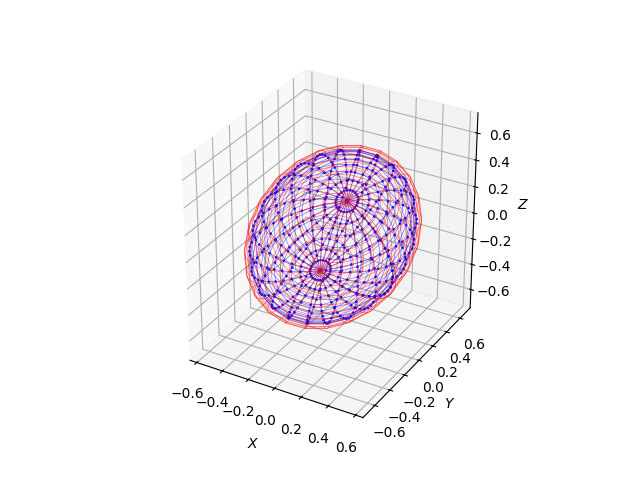

In [9]:
# sample a noisy ellipse
sqrt_m = 25
a, b, c = 0.5, 0.6, 0.7
yaw, pitch, roll =  0, 30, 30
nu = 1.0e-4
p = 1.6075

m, data, u = inner_problem((a,b,c), (yaw,pitch,roll), sqrt_m, nu, p, method="default", with_jac=False)

Theoretical min surface area is 4.835975862043171
    0 ellipsoid estimate (0.528, 0.642, 0.705, -1.18e-18°, 30.0°, 30.01°) has volume 1.0 and surface area 4.8941. LR 0.3
0.1711281988230625 tensor([[ 0.0034,  0.0039,  0.0038,  ..., -0.0068, -0.0066, -0.0057]],
       dtype=torch.float64)
    1 ellipsoid estimate (0.531, 0.64, 0.702, 7.985e-19°, 30.66°, 29.08°) has volume 1.0 and surface area 4.8897. LR 0.3
0.1635607370326315 tensor([[ 0.0031,  0.0036,  0.0035,  ..., -0.0063, -0.0061, -0.0054]],
       dtype=torch.float64)
    2 ellipsoid estimate (0.537, 0.637, 0.698, 3.859e-16°, 31.77°, 27.57°) has volume 1.0 and surface area 4.8831. LR 0.3
0.15251678544850727 tensor([[ 0.0025,  0.0030,  0.0030,  ..., -0.0052, -0.0051, -0.0046]],
       dtype=torch.float64)
    3 ellipsoid estimate (0.544, 0.633, 0.694, 1.42e-16°, 33.12°, 25.66°) has volume 1.0 and surface area 4.876. LR 0.3
0.14125212337060694 tensor([[ 0.0020,  0.0024,  0.0025,  ..., -0.0039, -0.0040, -0.0037]],
       dtype=torch.f

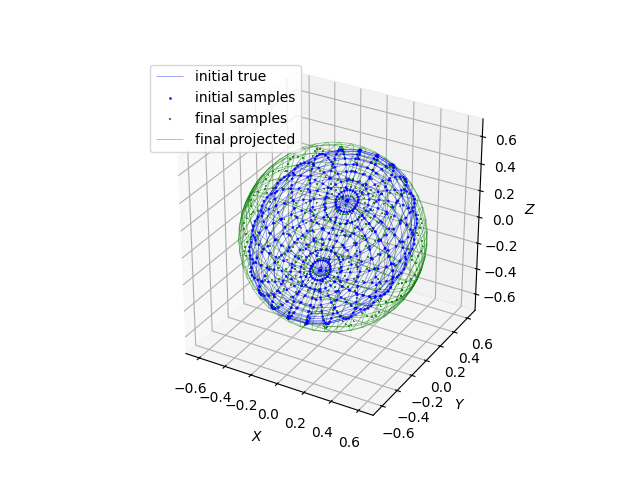

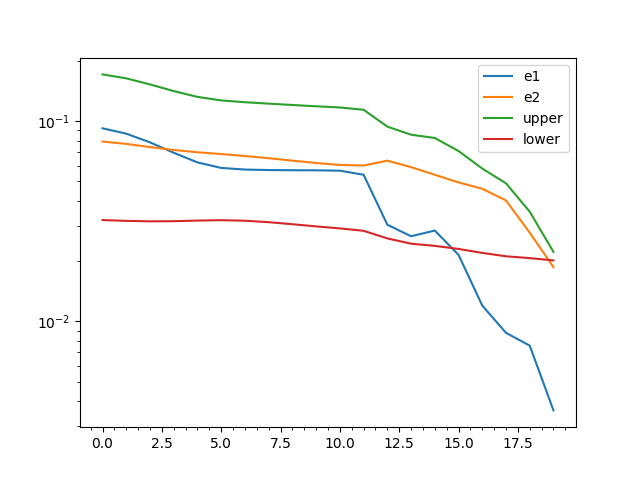

In [10]:
view_angles = torch.deg2rad(torch.tensor([
    [10,0,20],
    [30,40,60],
    # [10, 32, 96]
], dtype=torch.double))
rot_mats= rotation_matrix_3d_batch(view_angles)
r=0.620350490899
targets = torch.stack([
    sample_target_ellipse(50,a=r,b=r),
    sample_target_ellipse(50,a=r,b=r),
])

views = (rot_mats, targets)
u_original = (a,b,c,yaw,pitch,roll)
u = outer_problem(m, data, views=views, original_params=u_original, loss_func=NaiveChamferLoss, n_iters=20, with_jac=False, lr=0.3, moment=0.7, method="default")


In [15]:
### PYTORCH3D VERSION
from pytorch3d.loss import chamfer_distance

class PyTorchChamferLoss(nn.Module):
    def __init__(self, views, loss_vals, m=50):
        super().__init__()
        rot_mats, contours = views
        self.rot_mats = rot_mats
        self.target_pts = contours
        self.loss_vals = loss_vals
        self.m = m # how many points to sample

    def forward(self, input, p=1.6075):
        A = A_from_u_batch(input).double()

        n = self.target_pts.size(0)
        ellipses = torch.empty((n, 2, 2), dtype=torch.double)
        for i, R in enumerate(self.rot_mats):
            ellipse = schur_complement_batch(R @ A @ R.T)
            ellipses[i] = ellipse
        matrix_sqrts = pos_sqrt(ellipses)
        sampled_pts = sample_pts(matrix_sqrts, m=self.m)
        chamfer_dist = self.chamfer(sampled_pts)
        return chamfer_dist

    def chamfer(self, sampled_pts):
        res, _ = chamfer_distance(sampled_pts.float(), self.target_pts.float(),
                                  batch_reduction=None,
                                  point_reduction="mean")
        for i, l in enumerate(res):
            self.loss_vals[f"e{i+1}"].append(l.item())

        # print(res.sum().item())
        return res.sum()


Ellipsoid (blue) (0.5, 0.6, 0.7, 0.0°, 30.0°, 30.0°) has volume 0.88 and surface area 4.51
Ellipsoid (red) (0.528, 0.642, 0.705, 0.004209°, 29.99°, 30.0°) has volume 1.0 and surface area 4.89


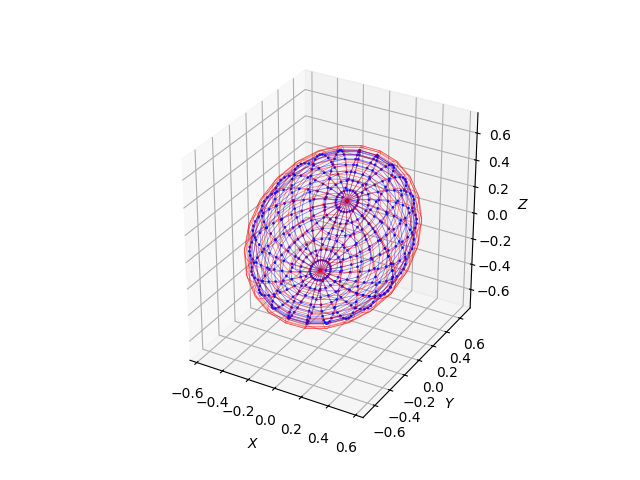

Theoretical min surface area is 4.835975862043171
    0 ellipsoid estimate (0.528, 0.642, 0.705, 0.004209°, 29.99°, 30.0°) has volume 1.0 and surface area 4.8941. LR 3
0.009038086980581284 tensor([[ 0.0003,  0.0004,  0.0004,  ..., -0.0006, -0.0006, -0.0005]],
       dtype=torch.float64)
    1 ellipsoid estimate (0.531, 0.64, 0.702, -2.506e-18°, 30.57°, 29.32°) has volume 1.0 and surface area 4.8898. LR 3
0.008363470435142517 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0006, -0.0006, -0.0005]],
       dtype=torch.float64)
    2 ellipsoid estimate (0.537, 0.637, 0.699, -1.719e-16°, 31.57°, 28.27°) has volume 1.0 and surface area 4.8833. LR 3
0.007422056049108505 tensor([[ 0.0002,  0.0003,  0.0003,  ..., -0.0005, -0.0005, -0.0004]],
       dtype=torch.float64)
    3 ellipsoid estimate (0.543, 0.633, 0.694, 1.507e-17°, 32.76°, 27.16°) has volume 1.0 and surface area 4.8766. LR 3
0.006517533678561449 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0004, -0.0004, -0.0004]],
       dtype=torch.

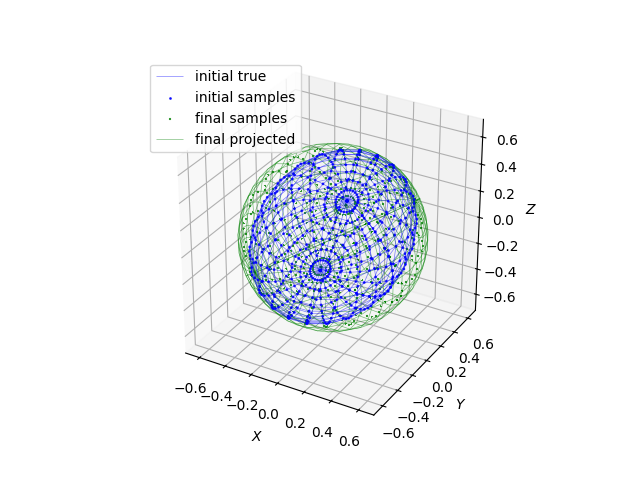

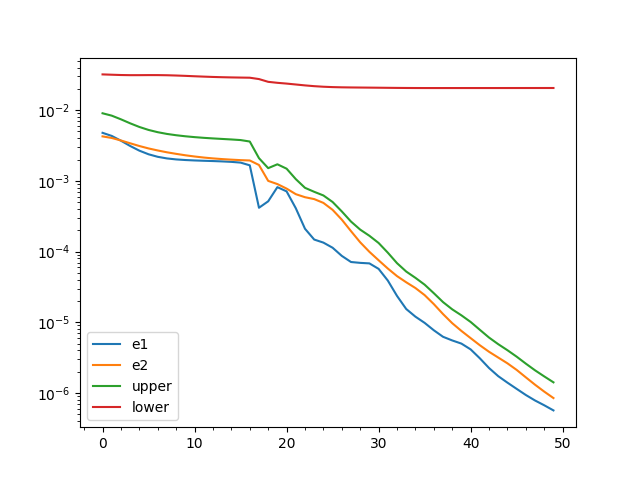

In [16]:
# sample a noisy ellipse
sqrt_m = 25
a, b, c = 0.5, 0.6, 0.7
yaw, pitch, roll =  0, 30, 30
nu = 1.0e-4
p = 1.6075

m, data, u = inner_problem((a,b,c), (yaw,pitch,roll), sqrt_m, nu, p, method="default", with_jac=False)
u = outer_problem(m, data, views=views, original_params=u_original, loss_func=PyTorchChamferLoss, n_iters=50, with_jac=False, lr=3, moment=0.7, method="default")

## Chamfer with Boundary Point Detection

To detect boundary points, we are going to 
1. Sample points from another ellipsoid given the parametrisation from the lower level problem (the projected unit volume ellipsoid). 
2. Then, we project the points onto the x-y plane by setting the z-component of the points to 0. Optional: apply farthest point sampling to obtain a more uniformly distributed set of points. 
3. Following this, we find an alpha shape and extract the boundary points to perform our loss function on.

In [18]:
### PYTORCH3D VERSION


class ChamferLossBoundary(nn.Module):
    def __init__(self, views, loss_vals, m=50):
        super().__init__()
        rot_mats, contours = views
        self.rot_mats = rot_mats
        self.target_pts = contours
        self.loss_vals = loss_vals
        self.m = m # how many points to sample

    def forward(self, input, p=1.6075):
        A = A_from_u_batch(input).double()
        # print("A", A, "angles", np.deg2rad(get_angles(A.squeeze().detach().numpy())))
        n_batches = A.size(0)
        n_rot = self.rot_mats.size(0)
        matrix_sqrts = torch.empty((n_rot, n_batches, 3, 3), dtype=torch.double) # n_rot x n_batches x 3 x 3
        for i, R in enumerate(self.rot_mats):
            rotated_A = R.mT @ A @ R
            matrix_sqrts[i] = self.pos_sqrt(rotated_A)
        matrix_sqrts = matrix_sqrts.transpose(0,1)
        sampled_pts = self.sample_ellipsoid_pts(matrix_sqrts, m=12) # n_batches x n_rot x 3 x N
        # sampled_pts = sampled_pts.squeeze().detach()
        # for i, e in enumerate(sampled_pts):
        #     u = fit_ellipsoid(e.unsqueeze(0))
        #     print(u)
        #     a,b,c,yaw,pitch,roll = u[0].squeeze()
        #     yaw,pitch,roll = torch.rad2deg(torch.tensor([yaw,pitch,roll]))
        #     fig = plt.figure()
        #     ax = fig.add_subplot(111, projection='3d')
        #     plot_ellipsoid(ax, a,b,c,yaw,pitch,roll)
        #     ax.set_xlabel('$X$')
        #     ax.set_ylabel('$Y$')
        #     ax.set_zlabel('$Z$')
        #     ax.scatter(e[0].numpy(), e[1].numpy(), e[2].numpy(), color='b', alpha=0.8, s=1)
        #     ax.set_aspect('equal', adjustable='box')
        #     plt.show()
        # raise NotImplementedError
        projected_pts = self.project(sampled_pts) # n_batches x n_rot x 2 x N
        # print("projected points shape", projected_pts.size(), projected_pts.dtype)
        projected_pts_np = projected_pts.transpose(-1, -2).detach().cpu().numpy() # n_batches x n_rot x N x 2
        hulls = []
        alphas = []
        boundary_points = []
        lengths = []
        for b, batch in enumerate(projected_pts_np):
            batch_boundary_points = []      
            batch_hull = []
            for r, rot_pts in enumerate(batch):
                # print(f"Batch {b+1} Rotation {r+1}")
                # print("Optimising alpha")
                # alpha = alphashape.optimizealpha(rot_pts, max_iterations=50)
                # alphas.append(alpha)
                # print("Finding alpha shape")
                hull = alphashape.alphashape(rot_pts, 0)
                # print("Found alpha shape")
                batch_hull.append(hull)
                boundary = hull.exterior.coords.xy # shape of 2 x N boundary points
                boundary_torch = self.find_common_points(projected_pts[b,r,:,:], boundary)
                # print("boundary torch size", boundary_torch.size())
                batch_boundary_points.append(boundary_torch)
            hulls.append(batch_hull)
            if False:
                batch_lengths = torch.tensor([t.size(1) for t in batch_boundary_points])
                lengths.append(batch_lengths)
                max_length = batch_lengths.max()
                padded = []
                # print("maxlength", max_length)
                for t in batch_boundary_points:
                    if max_length == t.size(1):
                        padded.append(t)
                    else:
                        padded.append(torch.cat([t, torch.full((t.size(0), max_length - t.size(1)), float('nan'))], dim=1))
                padded_batch_boundary_points = torch.stack(padded)
                boundary_points.append(padded_batch_boundary_points)
            else:
                batch_lengths = torch.tensor([t.size(1) for t in batch_boundary_points])
                lengths.append(batch_lengths)
                min_length = batch_lengths.min()
                truncated = torch.stack([t[:,:min_length] for t in batch_boundary_points])
                boundary_points.append(truncated)
        # print("Alphas:", alphas)
        self.plot_alpha_shapes(projected_pts, boundary_points, hulls)
        chamfer_dist = 0
        for batch, b_lengths in zip(boundary_points, lengths):
            chamfer_dist += self.chamfer(batch.transpose(-1,-2), b_lengths)
        return chamfer_dist

    def project(self, points: torch.tensor):
        # Assuming points shape is (n_batches x n_rot x 3 x N)
        projection = points[:, :, :2, :]  # Keep only the first 2 coordinates for projection
        return projection

    def chamfer(self, sampled_pts, lengths):
        res, _ = chamfer_distance(sampled_pts.float(), self.target_pts.float(),
                                  batch_reduction=None,
                                  point_reduction="mean")
        for i, l in enumerate(res):
            self.loss_vals[f"e{i+1}"].append(l.item())
        # print(res.sum().item())
        return res.sum()
    
    def find_common_points(self, pts_torch, pts_np):
        """
        shape of both input arrays/tensors is d x N, where d is the dimension of the point
        """
        np_to_torch = torch.tensor(pts_np, device=pts_torch.device, dtype=pts_torch.dtype)
        selected_points = []
        for i in range(pts_torch.shape[1]): 
            point = pts_torch[:, i]  
            if any(torch.allclose(point, np_to_torch[:, j], atol=1e-6) for j in range(np_to_torch.shape[1])):
                selected_points.append(point)  
        if selected_points:
            selected_points_tensor = torch.stack(selected_points, dim=1) 
        else:
            selected_points_tensor = torch.empty(2, 0, device=pts_torch.device)
        
        return selected_points_tensor

    def sample_ellipsoid_pts(self, sqrtA, m=50):
        phi = 2.0 * math.pi * torch.linspace(0.0, 1.0, m).double()
        theta = math.pi * torch.linspace(0.0, 1.0, m).double()
        phi, theta = torch.meshgrid(phi, theta)
        x = torch.sin(theta) * torch.cos(phi)
        y = torch.sin(theta) * torch.sin(phi)
        z = torch.cos(theta)
        coords = torch.stack((x.flatten(), y.flatten(), z.flatten()), dim=0).double().to(sqrtA.device)
        x = torch.sin(phi) * torch.cos(theta)
        y = torch.sin(phi) * torch.sin(theta)
        z = torch.cos(phi)
        coords2 = torch.stack((x.flatten(), y.flatten(), z.flatten()), dim=0).double().to(sqrtA.device)
        coords = torch.cat([coords, coords2], dim=1)
        inverse_sqrtA = torch.linalg.inv(sqrtA)#.transpose(-1,-2)
        sampled_pts = inverse_sqrtA @ coords
        return sampled_pts

    def pos_sqrt(self, A):
        """
        A: a (batch_size x dxd) tensor where d is the dimension of the data
        """
        L = torch.linalg.cholesky(A, upper=True)
        # U,S,Vh = torch.linalg.svd(A)
        # S = torch.sqrt(S)
        # L = U @ torch.diagflat(S) @ Vh
        return L
    

    def plot_alpha_shapes(self, projected_pts, boundary_points, hulls):
            print(projected_pts.size())
            n_batches, n_rot, _, _ = projected_pts.size()
            fig, axs = plt.subplots(n_batches, n_rot, figsize=(4 * n_rot, 4 * n_batches), squeeze=False)

            for b in range(n_batches):
                for r in range(n_rot):
                    # Get the projected points for the current batch and rotation
                    rot_pts = projected_pts[b, r, :, :].detach().cpu().numpy()  # shape (2, N)

                    # Plot the alpha shape
                    hull = hulls[b][r]  # Access the corresponding hull
                    patch = PolygonPatch(hull, alpha=0.5, color='lightblue', edgecolor='blue')
                    axs[b, r].add_patch(patch)

                    # Plot the projected points
                    axs[b, r].scatter(rot_pts[0], rot_pts[1], color='orange', label='Projected Points', s=2)

                    # Get and plot boundary points for the current batch and rotation
                    batch_boundary_points = boundary_points[b][r].detach().cpu().numpy()  # shape (2, M)
                    axs[b, r].scatter(batch_boundary_points[0], batch_boundary_points[1], color='red', label='Boundary Points', s=2)

                    # Plot the target shape
                    target_contour = self.target_pts[r].mT
                    axs[b, r].scatter(target_contour[0], target_contour[1], color='blue', label ='Target Points', s=2)

                    # Set titles and labels
                    axs[b, r].set_title(f'Batch {b+1}, Rotation {r+1}')
                    axs[b, r].set_xlabel('X-axis')
                    axs[b, r].set_ylabel('Y-axis')
                    axs[b, r].set_xlim(-1, 1)  # Adjust limits based on your data
                    axs[b, r].set_ylim(-1, 1)
                    axs[b, r].grid()
                    axs[b, r].legend()

            plt.tight_layout()
            plt.show()


Ellipsoid (blue) (0.5, 0.6, 0.7, 30.0°, 40.0°, 50.0°) has volume 0.88 and surface area 4.51
Ellipsoid (red) (0.528, 0.642, 0.705, 30.0°, 40.0°, 49.98°) has volume 1.0 and surface area 4.89


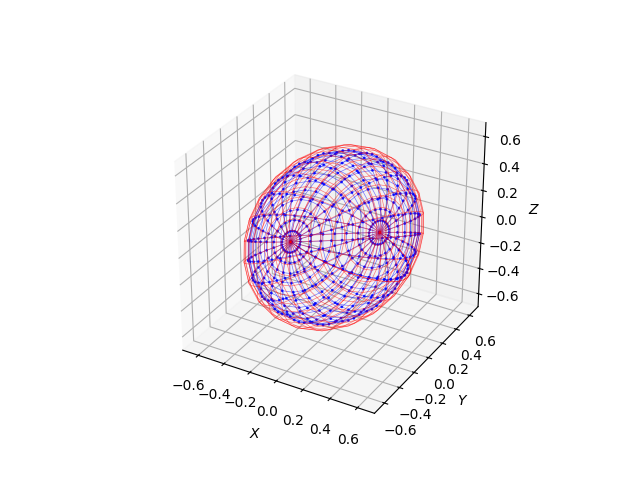

Theoretical min surface area is 4.835975862043171
    0 ellipsoid estimate (0.528, 0.642, 0.705, 30.0°, 40.0°, 49.98°) has volume 1.0 and surface area 4.8941. LR 1
torch.Size([1, 2, 2, 288])


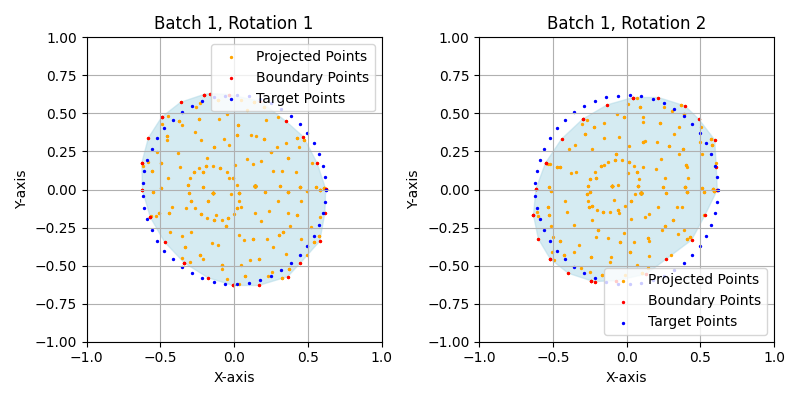

0.013716783374547958 tensor([[ 0.0004,  0.0004,  0.0004,  ..., -0.0003, -0.0003, -0.0003]],
       dtype=torch.float64)
    1 ellipsoid estimate (0.529, 0.641, 0.704, 30.18°, 39.86°, 50.07°) has volume 1.0 and surface area 4.8926. LR 1
torch.Size([1, 2, 2, 288])


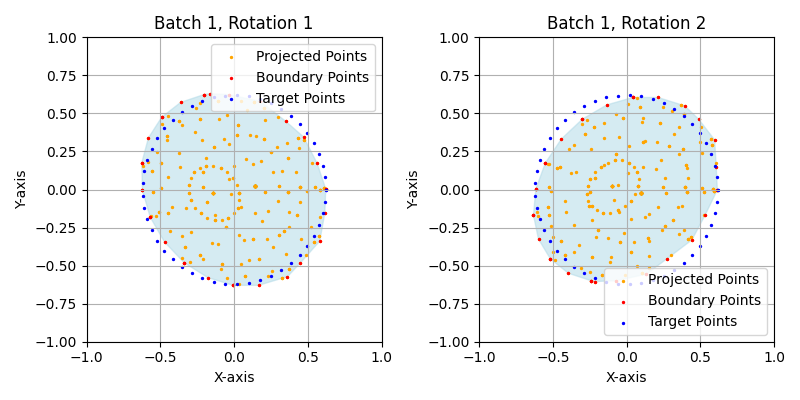

0.013553187251091003 tensor([[ 0.0004,  0.0004,  0.0003,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
    2 ellipsoid estimate (0.531, 0.64, 0.703, 30.52°, 39.62°, 50.23°) has volume 1.0 and surface area 4.8904. LR 1
torch.Size([1, 2, 2, 288])


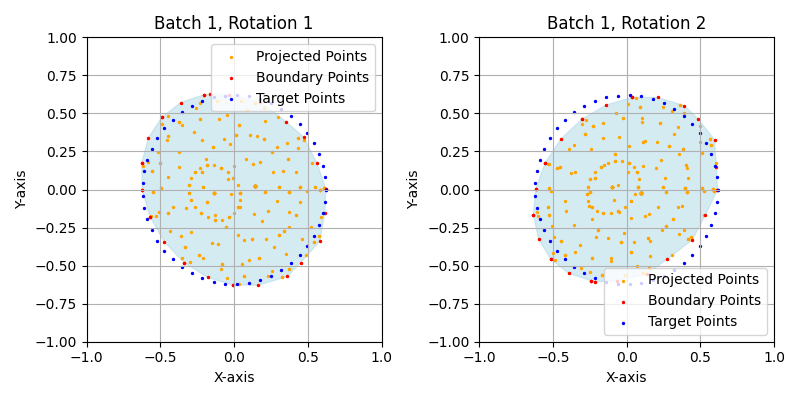

0.013317754492163658 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
    3 ellipsoid estimate (0.533, 0.638, 0.702, 30.96°, 39.33°, 50.44°) has volume 1.0 and surface area 4.8879. LR 1
torch.Size([1, 2, 2, 288])


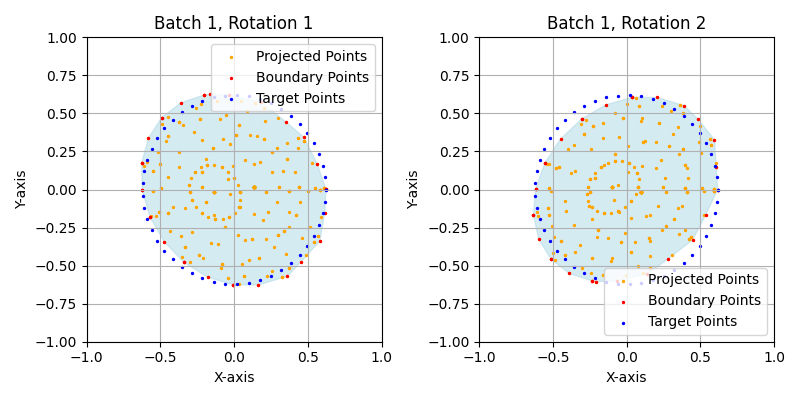

0.013024214655160904 tensor([[ 0.0004,  0.0004,  0.0003,  ..., -0.0003, -0.0003, -0.0003]],
       dtype=torch.float64)
    4 ellipsoid estimate (0.535, 0.636, 0.701, 31.5°, 38.95°, 50.82°) has volume 1.0 and surface area 4.8852. LR 1
torch.Size([1, 2, 2, 288])


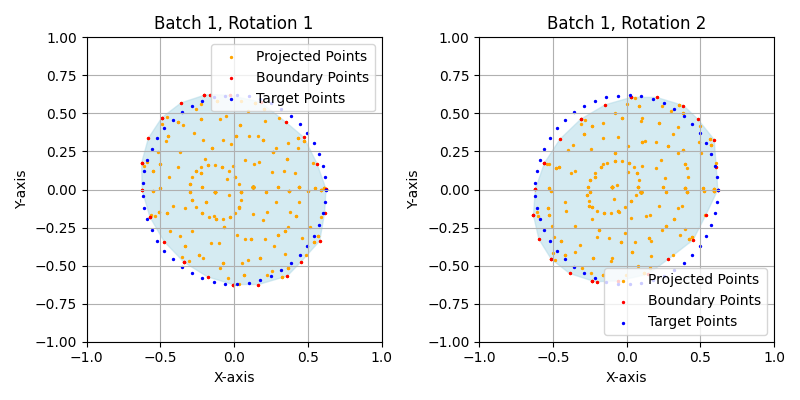

0.012691543437540531 tensor([[ 0.0004,  0.0004,  0.0003,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
    5 ellipsoid estimate (0.538, 0.634, 0.7, 32.09°, 38.51°, 51.31°) has volume 1.0 and surface area 4.8825. LR 1
torch.Size([1, 2, 2, 288])


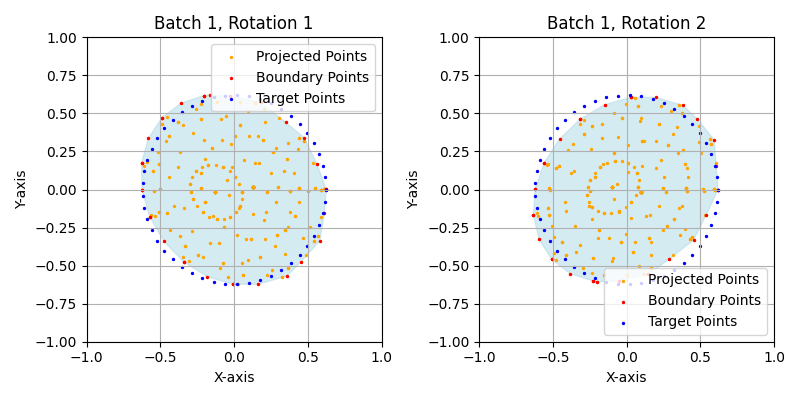

0.012381105683743954 tensor([[ 0.0004,  0.0004,  0.0004,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
    6 ellipsoid estimate (0.54, 0.632, 0.699, 32.7°, 38.02°, 51.84°) has volume 1.0 and surface area 4.8801. LR 1
torch.Size([1, 2, 2, 288])


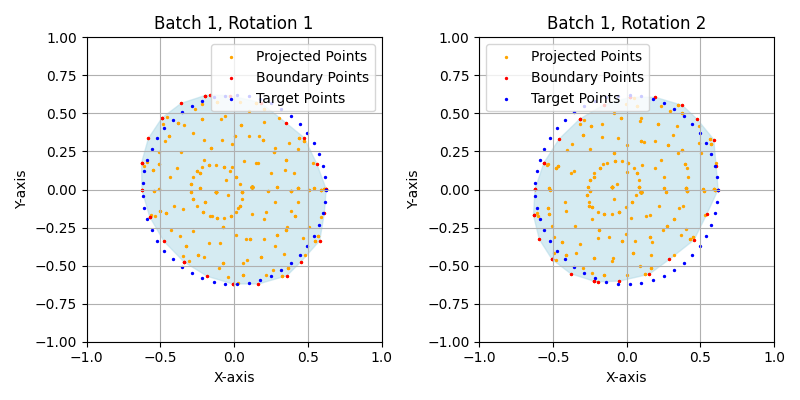

0.012119213119149208 tensor([[ 0.0003,  0.0004,  0.0003,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
    7 ellipsoid estimate (0.542, 0.631, 0.697, 33.28°, 37.53°, 52.34°) has volume 1.0 and surface area 4.878. LR 1
torch.Size([1, 2, 2, 288])


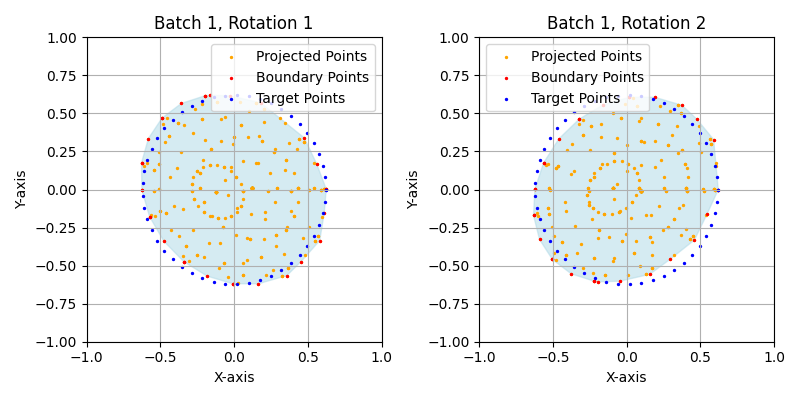

0.013242458924651146 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
    8 ellipsoid estimate (0.544, 0.63, 0.696, 33.8°, 37.05°, 52.78°) has volume 1.0 and surface area 4.8761. LR 1
torch.Size([1, 2, 2, 288])


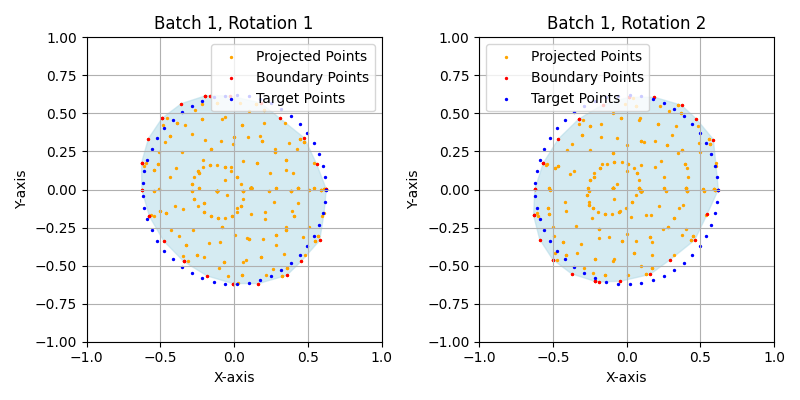

0.012983833439648151 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
    9 ellipsoid estimate (0.546, 0.629, 0.695, 34.25°, 36.59°, 53.16°) has volume 1.0 and surface area 4.8744. LR 1
torch.Size([1, 2, 2, 288])


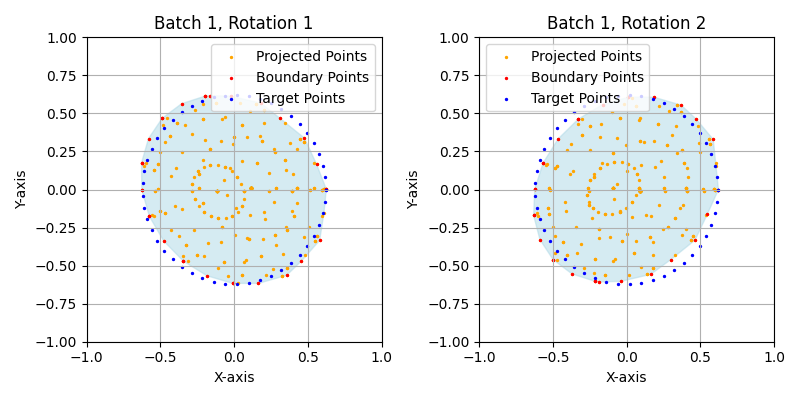

0.012826873920857906 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   10 ellipsoid estimate (0.548, 0.628, 0.694, 34.64°, 36.17°, 53.47°) has volume 1.0 and surface area 4.8729. LR 1
torch.Size([1, 2, 2, 288])


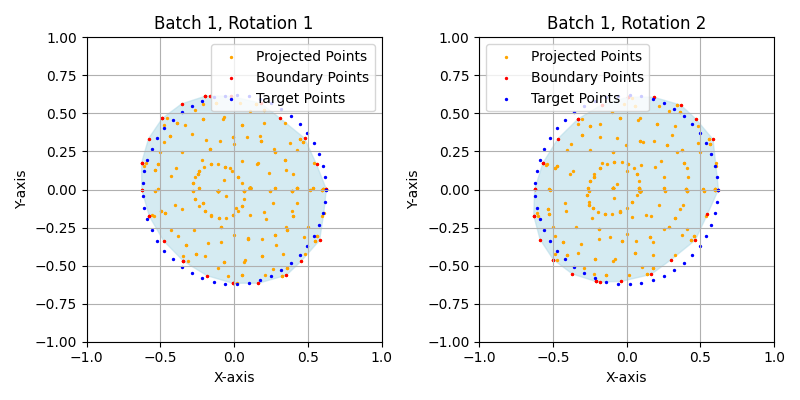

0.012683510780334473 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   11 ellipsoid estimate (0.549, 0.627, 0.693, 34.99°, 35.76°, 53.8°) has volume 1.0 and surface area 4.8715. LR 1
torch.Size([1, 2, 2, 288])


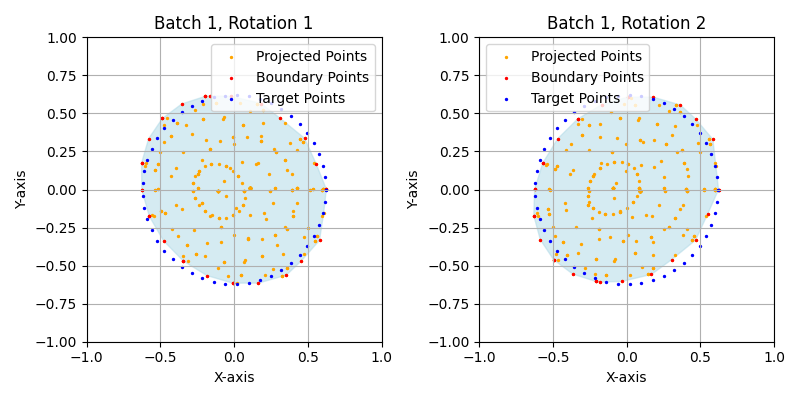

0.012552246451377869 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   12 ellipsoid estimate (0.551, 0.627, 0.692, 35.31°, 35.36°, 54.13°) has volume 1.0 and surface area 4.8702. LR 1
torch.Size([1, 2, 2, 288])


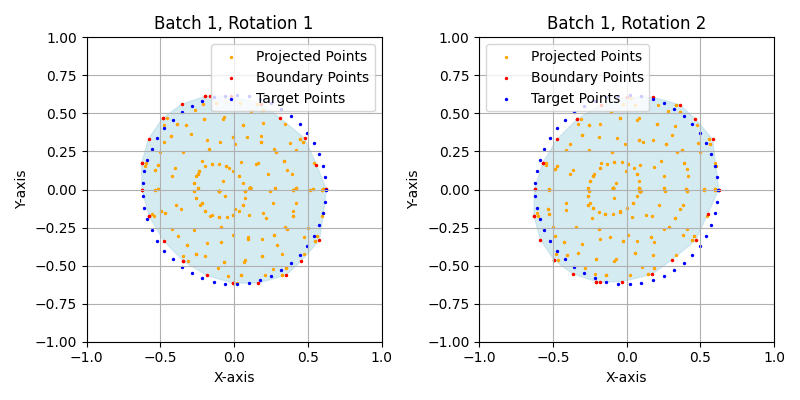

0.012425681576132774 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   13 ellipsoid estimate (0.552, 0.626, 0.691, 35.63°, 34.9°, 54.46°) has volume 1.0 and surface area 4.8691. LR 1
torch.Size([1, 2, 2, 288])


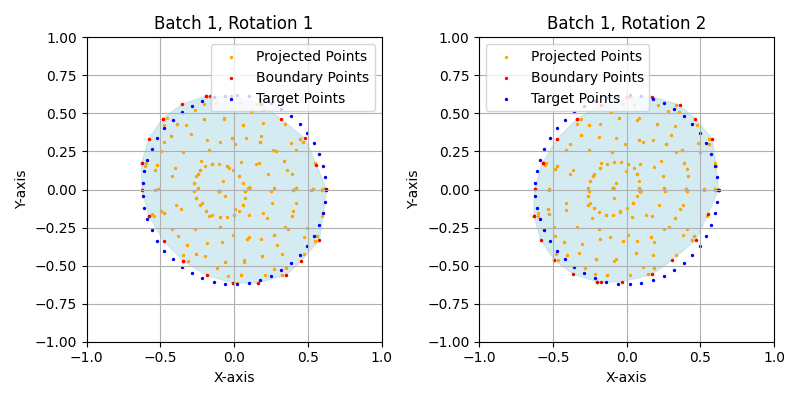

0.012307386845350266 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   14 ellipsoid estimate (0.553, 0.626, 0.69, 35.91°, 34.43°, 54.76°) has volume 1.0 and surface area 4.868. LR 1
torch.Size([1, 2, 2, 288])


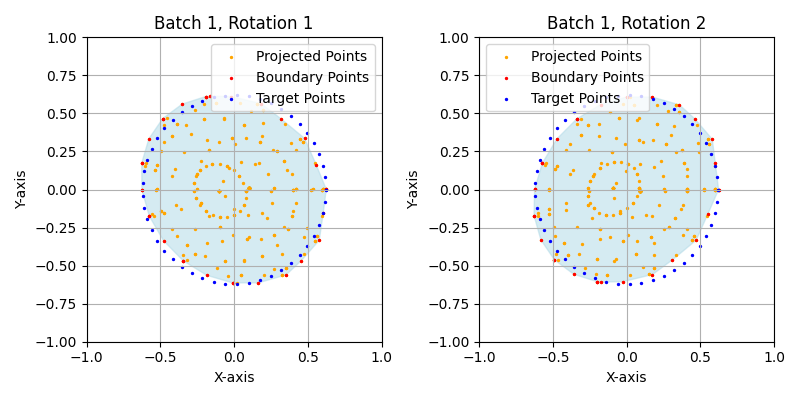

0.01089242473244667 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   15 ellipsoid estimate (0.554, 0.626, 0.689, 36.15°, 33.98°, 55.0°) has volume 1.0 and surface area 4.8671. LR 1
torch.Size([1, 2, 2, 288])


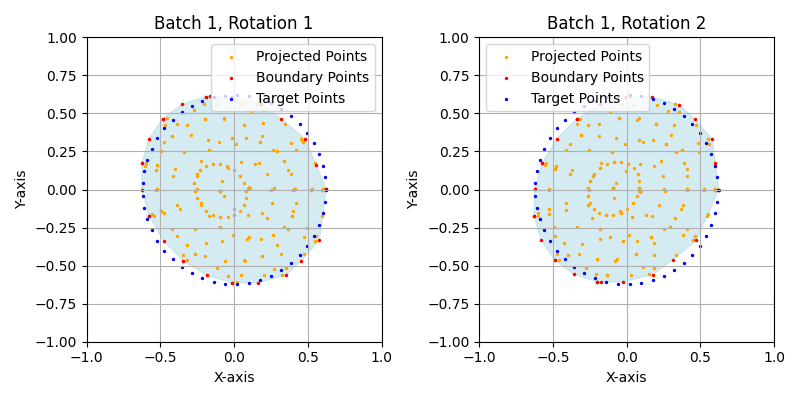

0.012168887071311474 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   16 ellipsoid estimate (0.555, 0.626, 0.688, 36.33°, 33.55°, 55.17°) has volume 1.0 and surface area 4.8663. LR 1
torch.Size([1, 2, 2, 288])


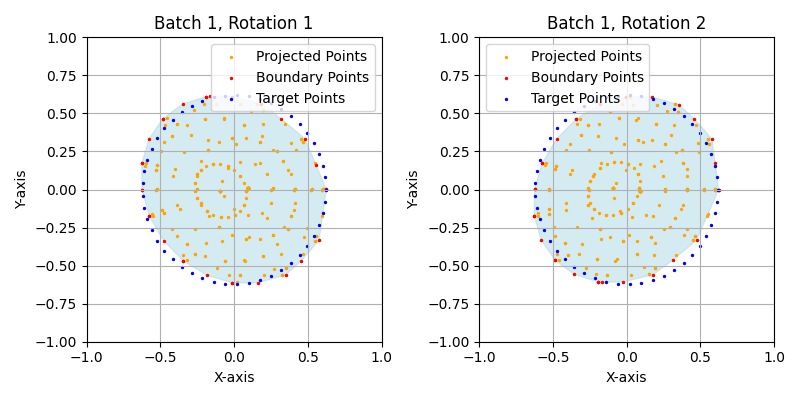

0.01208024937659502 tensor([[ 0.0003,  0.0003,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   17 ellipsoid estimate (0.556, 0.626, 0.687, 36.42°, 33.19°, 55.24°) has volume 1.0 and surface area 4.8655. LR 1
torch.Size([1, 2, 2, 288])


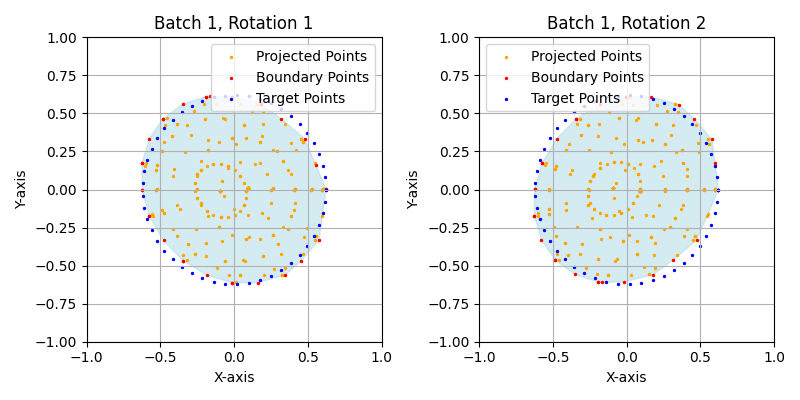

0.011996561661362648 tensor([[ 0.0002,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   18 ellipsoid estimate (0.556, 0.626, 0.686, 36.44°, 32.9°, 55.23°) has volume 1.0 and surface area 4.8648. LR 1
torch.Size([1, 2, 2, 288])


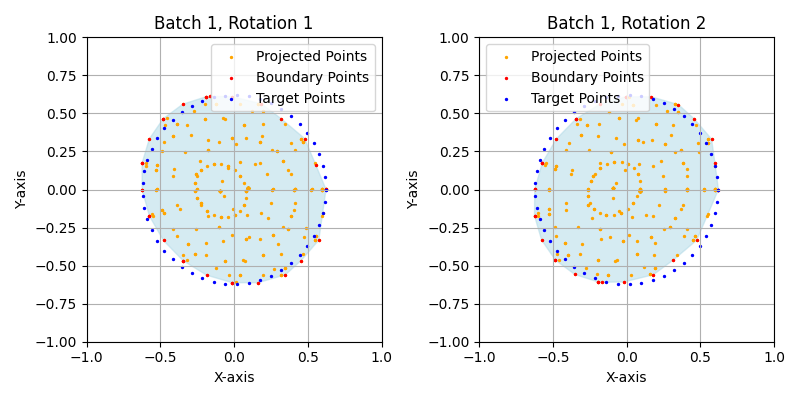

0.011910468339920044 tensor([[ 0.0003,  0.0003,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   19 ellipsoid estimate (0.557, 0.626, 0.685, 36.35°, 32.69°, 55.14°) has volume 1.0 and surface area 4.864. LR 1
torch.Size([1, 2, 2, 288])


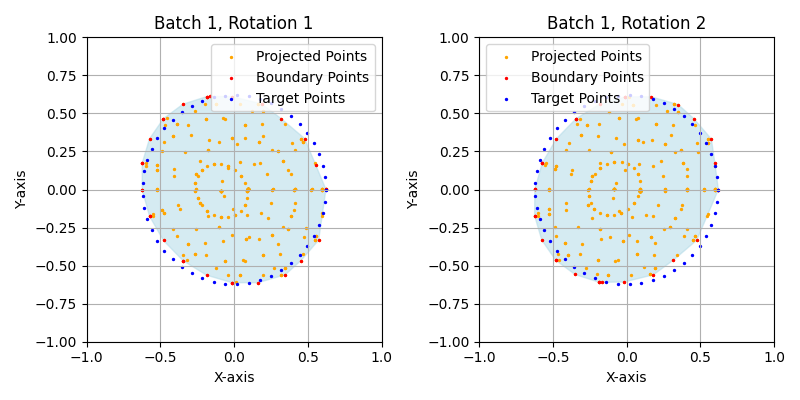

0.011821657419204712 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   20 ellipsoid estimate (0.558, 0.626, 0.684, 36.19°, 32.59°, 54.97°) has volume 1.0 and surface area 4.8633. LR 1
torch.Size([1, 2, 2, 288])


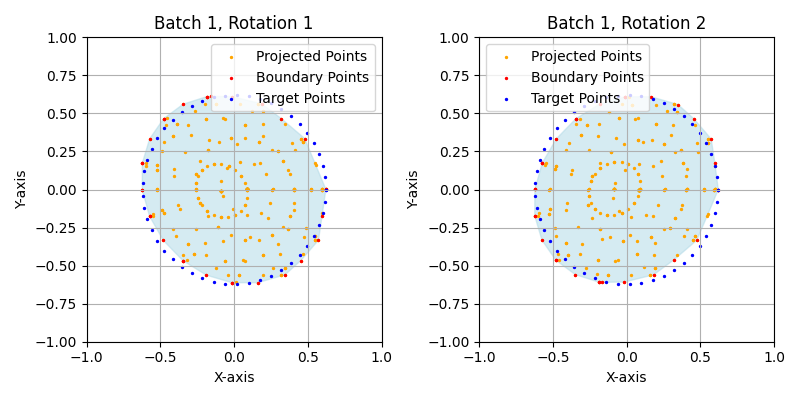

0.011779237538576126 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   21 ellipsoid estimate (0.559, 0.626, 0.683, 35.97°, 32.55°, 54.73°) has volume 1.0 and surface area 4.8625. LR 1
torch.Size([1, 2, 2, 288])


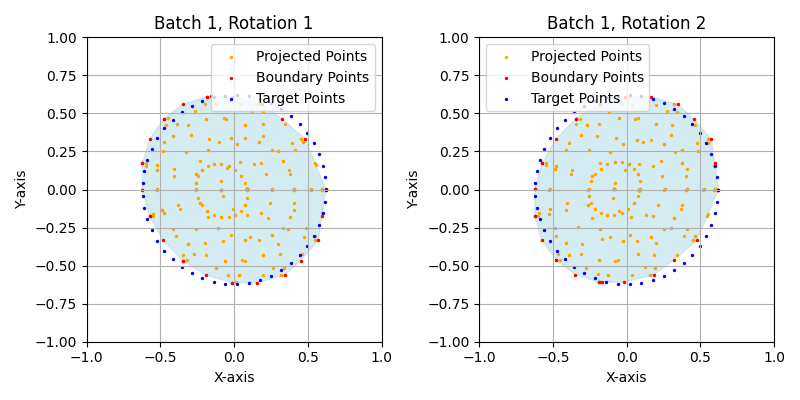

0.011688698083162308 tensor([[ 0.0003,  0.0004,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   22 ellipsoid estimate (0.559, 0.626, 0.682, 35.75°, 32.43°, 54.5°) has volume 1.0 and surface area 4.8617. LR 1
torch.Size([1, 2, 2, 288])


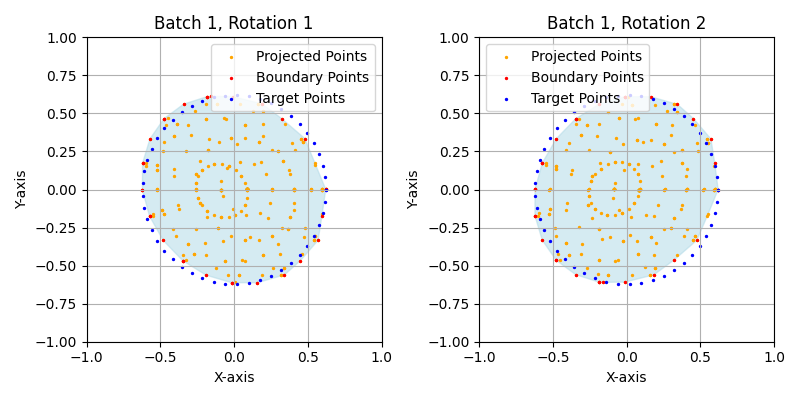

0.011586524546146393 tensor([[ 0.0003,  0.0003,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   23 ellipsoid estimate (0.56, 0.626, 0.681, 35.57°, 32.24°, 54.29°) has volume 1.0 and surface area 4.8609. LR 1
torch.Size([1, 2, 2, 288])


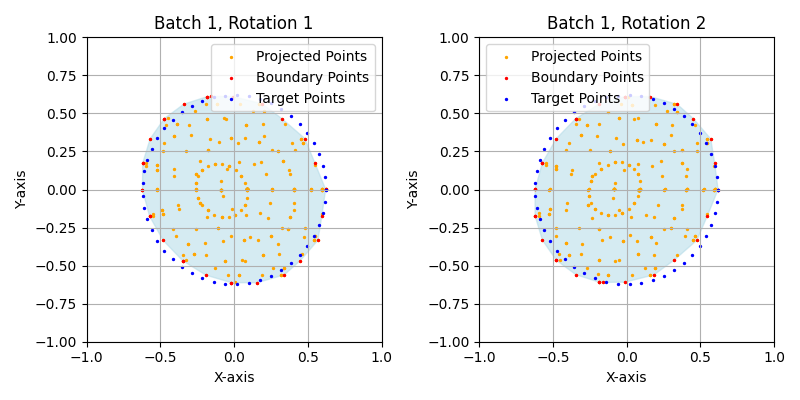

0.010081326588988304 tensor([[ 0.0003,  0.0003,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   24 ellipsoid estimate (0.561, 0.625, 0.68, 35.37°, 32.07°, 54.06°) has volume 1.0 and surface area 4.8601. LR 1
torch.Size([1, 2, 2, 288])


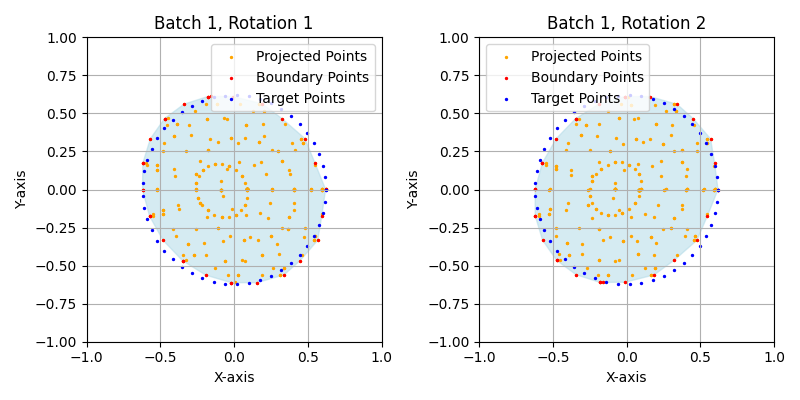

0.00995996780693531 tensor([[ 0.0003,  0.0004,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   25 ellipsoid estimate (0.563, 0.625, 0.679, 35.13°, 32.0°, 53.77°) has volume 1.0 and surface area 4.8591. LR 1
torch.Size([1, 2, 2, 288])


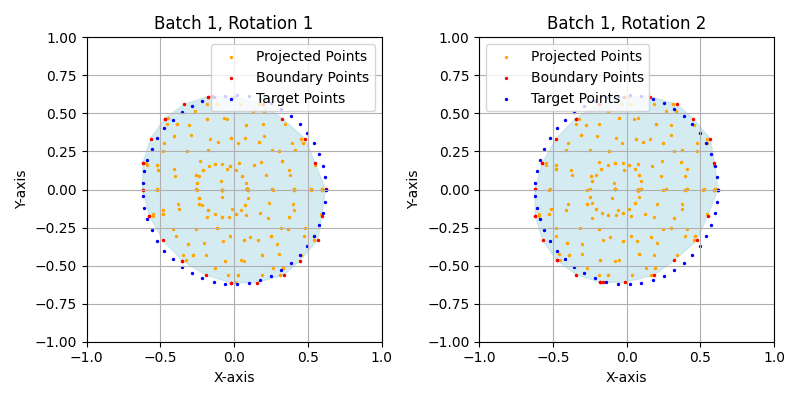

0.009804435074329376 tensor([[ 0.0003,  0.0004,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   26 ellipsoid estimate (0.564, 0.624, 0.678, 34.81°, 32.07°, 53.36°) has volume 1.0 and surface area 4.858. LR 1
torch.Size([1, 2, 2, 288])


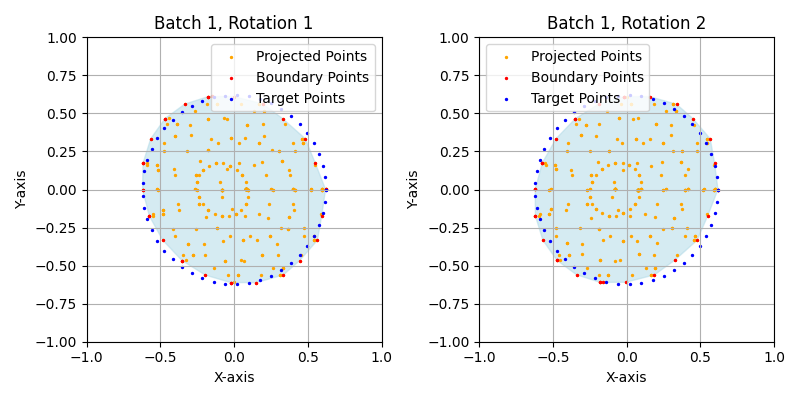

0.009614842012524605 tensor([[ 0.0004,  0.0004,  0.0004,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
   27 ellipsoid estimate (0.566, 0.623, 0.677, 34.47°, 32.16°, 52.93°) has volume 1.0 and surface area 4.8567. LR 1
torch.Size([1, 2, 2, 288])


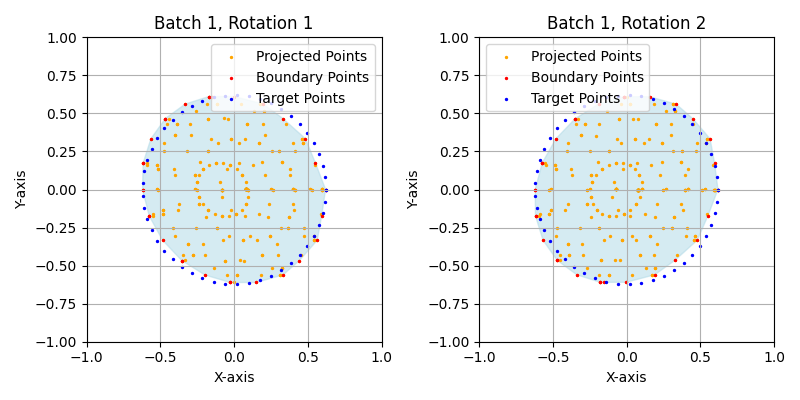

0.009401768445968628 tensor([[ 0.0004,  0.0004,  0.0004,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
   28 ellipsoid estimate (0.568, 0.622, 0.675, 34.14°, 32.21°, 52.57°) has volume 1.0 and surface area 4.8554. LR 1
torch.Size([1, 2, 2, 288])


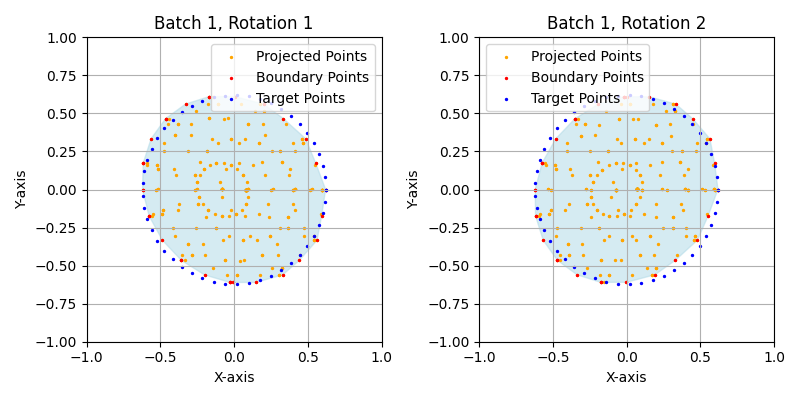

0.009198538027703762 tensor([[ 0.0003,  0.0004,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   29 ellipsoid estimate (0.57, 0.621, 0.674, 33.83°, 32.22°, 52.27°) has volume 1.0 and surface area 4.8542. LR 1
torch.Size([1, 2, 2, 288])


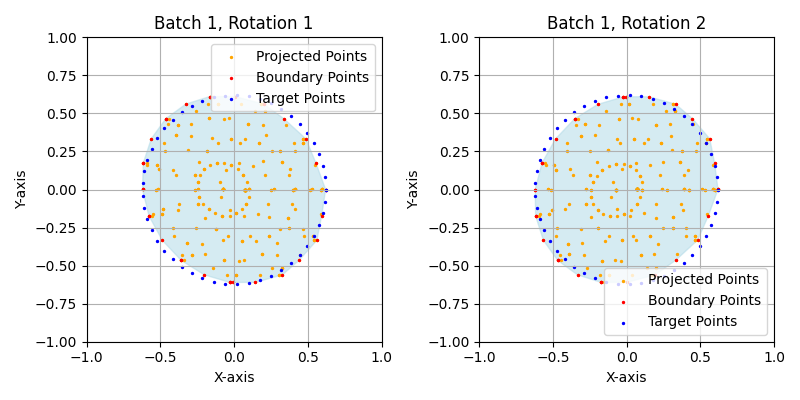

0.008990410715341568 tensor([[ 0.0003,  0.0004,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   30 ellipsoid estimate (0.572, 0.62, 0.673, 33.58°, 32.14°, 52.09°) has volume 1.0 and surface area 4.853. LR 1
torch.Size([1, 2, 2, 288])


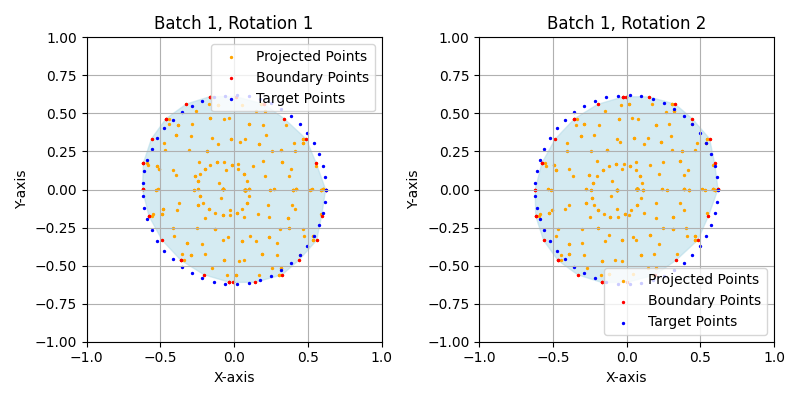

0.008800951763987541 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   31 ellipsoid estimate (0.574, 0.619, 0.672, 33.39°, 31.99°, 51.99°) has volume 1.0 and surface area 4.852. LR 1
torch.Size([1, 2, 2, 288])


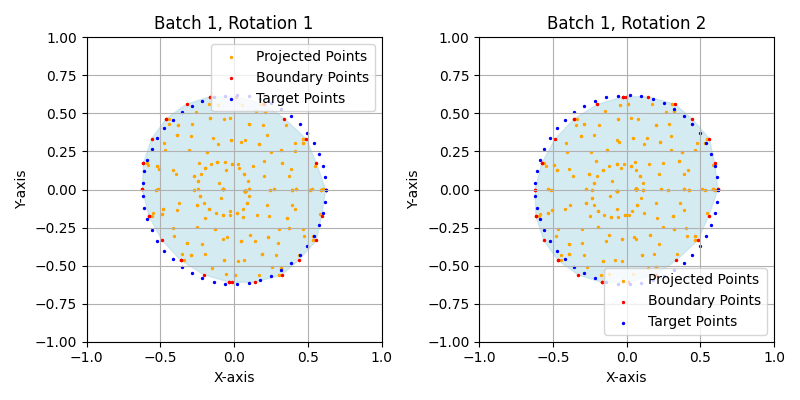

0.008638272061944008 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   32 ellipsoid estimate (0.576, 0.618, 0.671, 33.25°, 31.8°, 51.96°) has volume 1.0 and surface area 4.851. LR 1
torch.Size([1, 2, 2, 288])


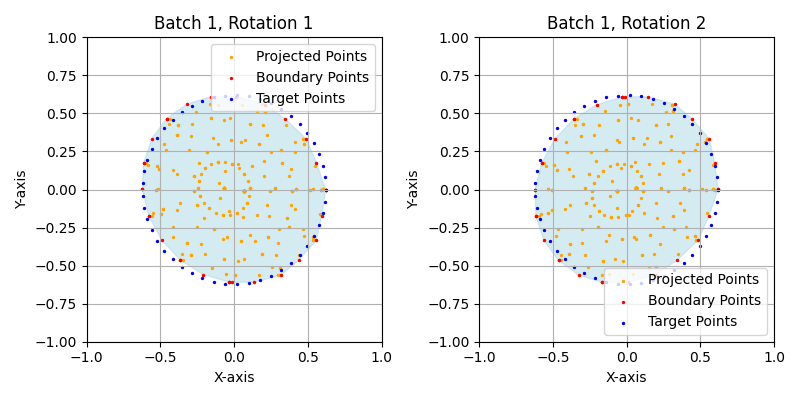

0.008482346311211586 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   33 ellipsoid estimate (0.578, 0.617, 0.67, 33.13°, 31.64°, 51.9°) has volume 1.0 and surface area 4.85. LR 1
torch.Size([1, 2, 2, 288])


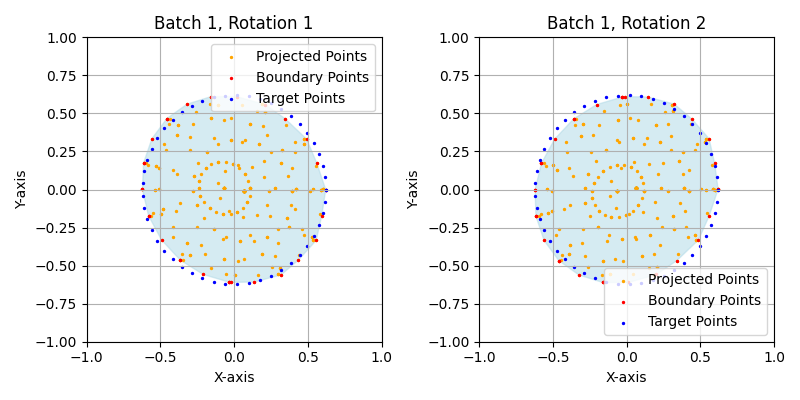

0.008341099135577679 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   34 ellipsoid estimate (0.58, 0.615, 0.669, 33.03°, 31.5°, 51.81°) has volume 1.0 and surface area 4.8492. LR 1
torch.Size([1, 2, 2, 288])


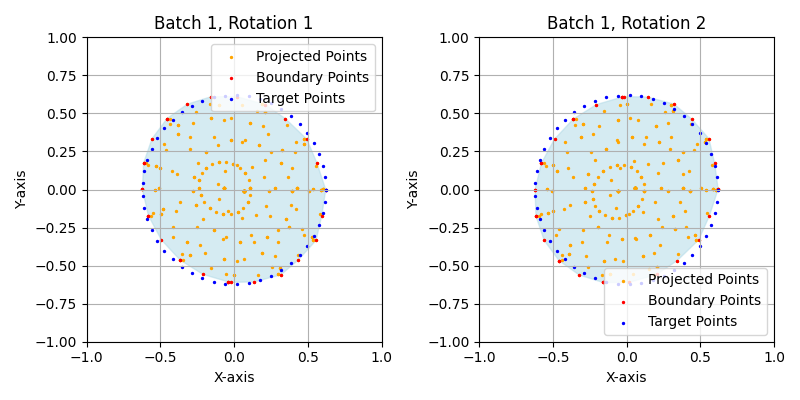

0.008217023685574532 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   35 ellipsoid estimate (0.582, 0.614, 0.668, 32.91°, 31.41°, 51.71°) has volume 1.0 and surface area 4.8485. LR 1
torch.Size([1, 2, 2, 288])


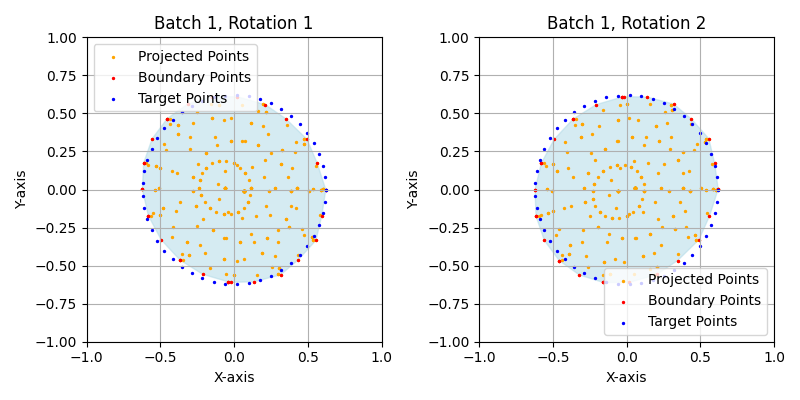

0.008096087723970413 tensor([[ 0.0002,  0.0003,  0.0002,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
   36 ellipsoid estimate (0.583, 0.614, 0.667, 32.79°, 31.37°, 51.62°) has volume 1.0 and surface area 4.8478. LR 1
torch.Size([1, 2, 2, 288])


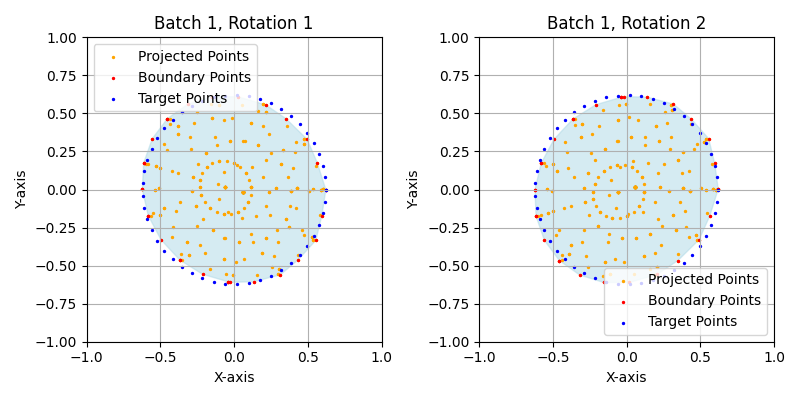

0.007982972078025341 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0002, -0.0002, -0.0001]],
       dtype=torch.float64)
   37 ellipsoid estimate (0.585, 0.613, 0.666, 32.71°, 31.34°, 51.52°) has volume 1.0 and surface area 4.8471. LR 1
torch.Size([1, 2, 2, 288])


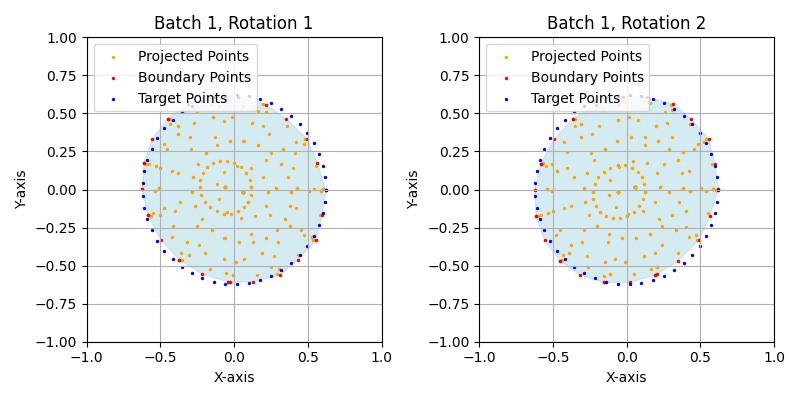

0.007914414629340172 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0002, -0.0002, -0.0001]],
       dtype=torch.float64)
   38 ellipsoid estimate (0.587, 0.612, 0.665, 32.6°, 31.34°, 51.4°) has volume 1.0 and surface area 4.8465. LR 1
torch.Size([1, 2, 2, 288])


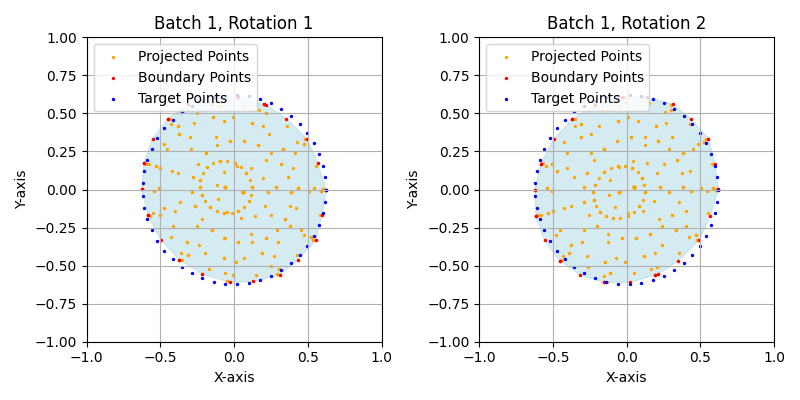

0.00788919534534216 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0002, -0.0001]],
       dtype=torch.float64)
   39 ellipsoid estimate (0.588, 0.611, 0.665, 32.47°, 31.32°, 51.26°) has volume 1.0 and surface area 4.846. LR 1
torch.Size([1, 2, 2, 288])


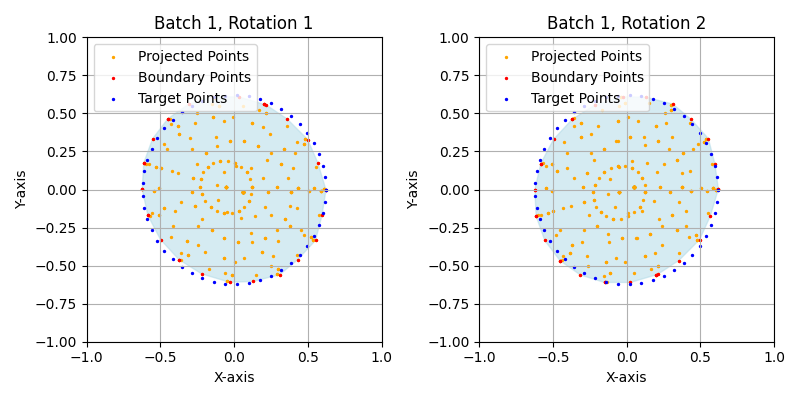

0.007800816558301449 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   40 ellipsoid estimate (0.59, 0.61, 0.664, 32.33°, 31.3°, 51.17°) has volume 1.0 and surface area 4.8455. LR 1
torch.Size([1, 2, 2, 288])


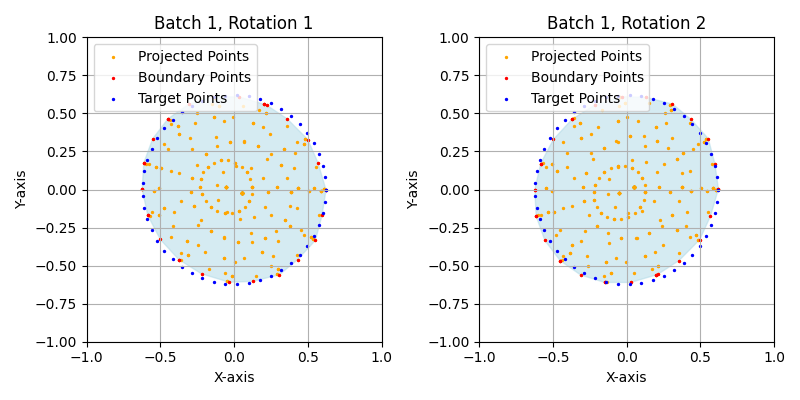

0.007718653418123722 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   41 ellipsoid estimate (0.591, 0.609, 0.663, 32.17°, 31.27°, 51.11°) has volume 1.0 and surface area 4.845. LR 1
torch.Size([1, 2, 2, 288])


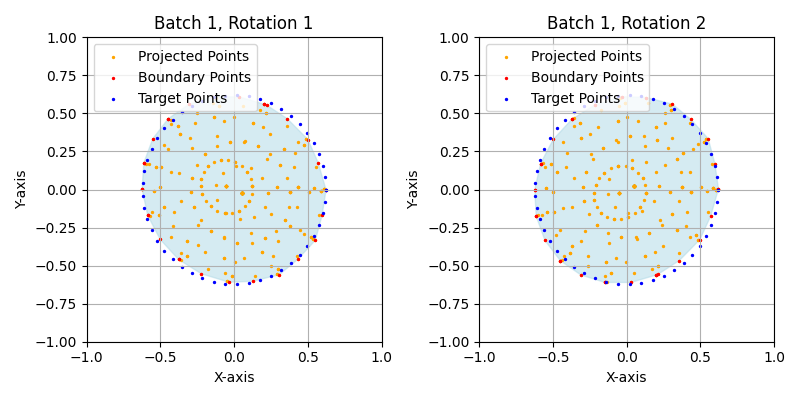

0.007641676813364029 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0002, -0.0002, -0.0001]],
       dtype=torch.float64)
   42 ellipsoid estimate (0.593, 0.608, 0.662, 32.03°, 31.25°, 51.07°) has volume 1.0 and surface area 4.8446. LR 1
torch.Size([1, 2, 2, 288])


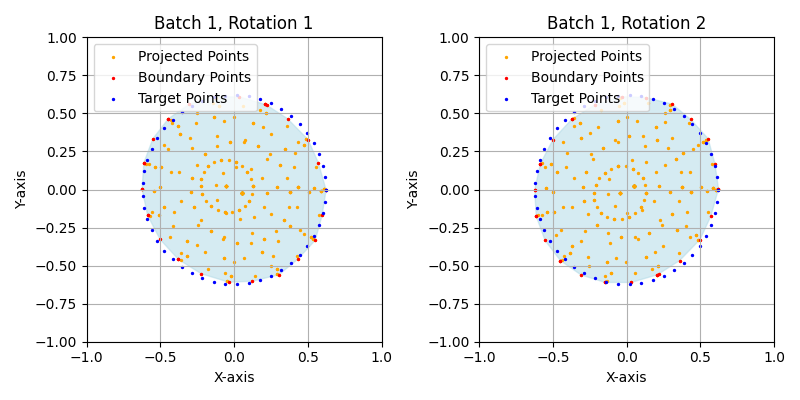

0.007555555552244186 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   43 ellipsoid estimate (0.594, 0.607, 0.662, 31.9°, 31.23°, 51.04°) has volume 1.0 and surface area 4.8442. LR 1
torch.Size([1, 2, 2, 288])


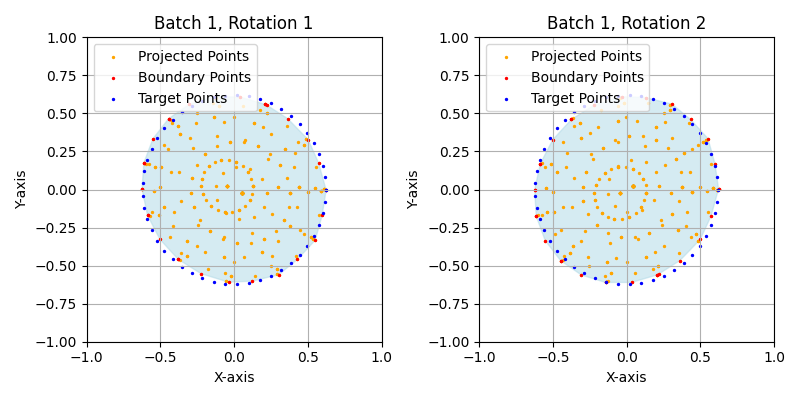

0.00748144555836916 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   44 ellipsoid estimate (0.593, 0.662, 0.608, -3.863e-16°, 48.64°, 104.4°) has volume 1.0 and surface area 4.8443. LR 1
torch.Size([1, 2, 2, 288])


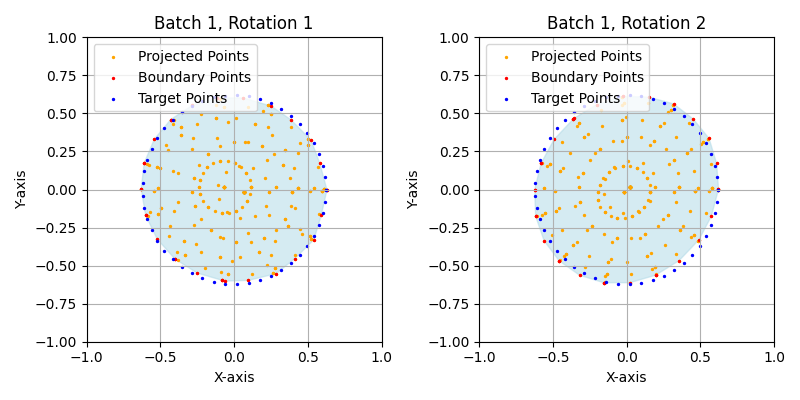

0.007495175581425428 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   45 ellipsoid estimate (0.599, 0.66, 0.604, -1.493e-16°, 50.95°, 116.3°) has volume 1.0 and surface area 4.8434. LR 1
torch.Size([1, 2, 2, 288])


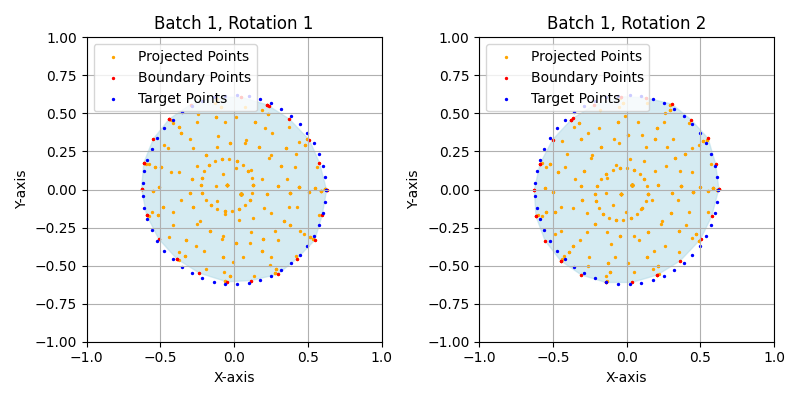

0.007268066518008709 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   46 ellipsoid estimate (0.6, 0.66, 0.603, 1.611e-16°, 51.36°, 119.0°) has volume 1.0 and surface area 4.8432. LR 1
torch.Size([1, 2, 2, 288])


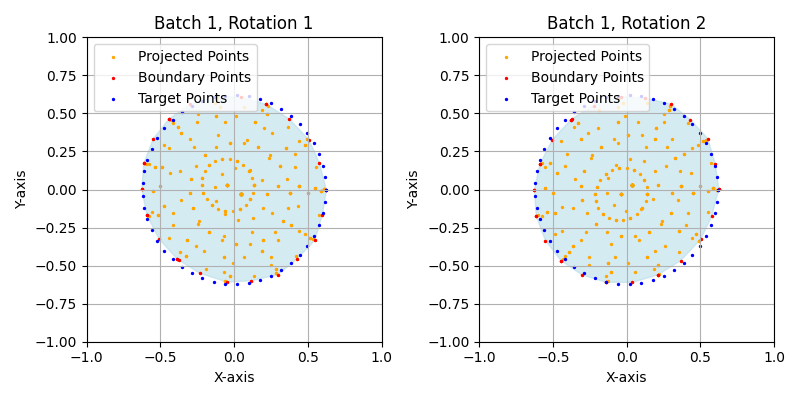

0.007218876853585243 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0002, -0.0001, -0.0001]],
       dtype=torch.float64)
   47 ellipsoid estimate (0.601, 0.659, 0.603, -5.939e-18°, 51.41°, 119.7°) has volume 1.0 and surface area 4.843. LR 1
torch.Size([1, 2, 2, 288])


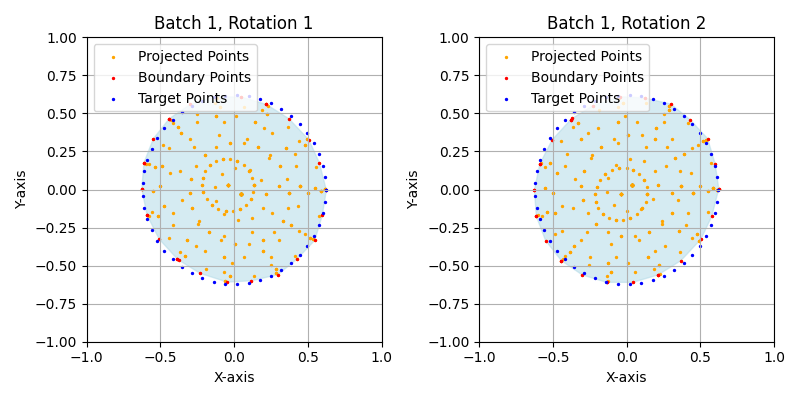

0.007168173789978027 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   48 ellipsoid estimate (0.602, 0.658, 0.602, -8.5e-18°, 51.4°, 120.0°) has volume 1.0 and surface area 4.8427. LR 1
torch.Size([1, 2, 2, 288])


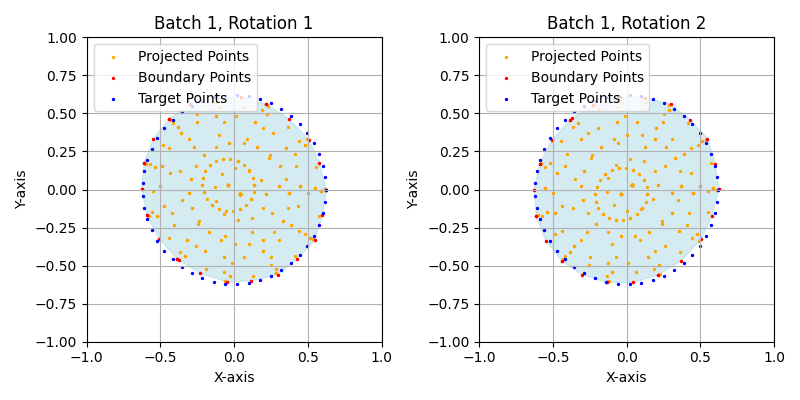

0.007127499673515558 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   49 ellipsoid estimate (0.603, 0.658, 0.602, -2.94e-18°, 51.38°, 120.1°) has volume 1.0 and surface area 4.8425. LR 1
torch.Size([1, 2, 2, 288])


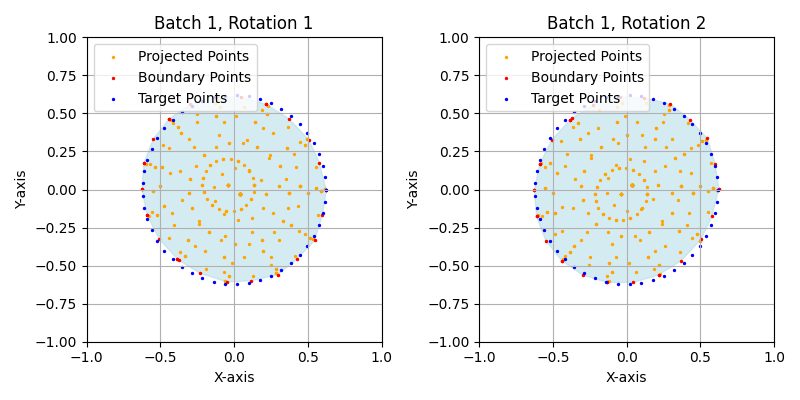

0.007090162020176649 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   50 ellipsoid estimate (0.604, 0.657, 0.602, -7.395e-18°, 51.35°, 120.2°) has volume 1.0 and surface area 4.8423. LR 1
torch.Size([1, 2, 2, 288])


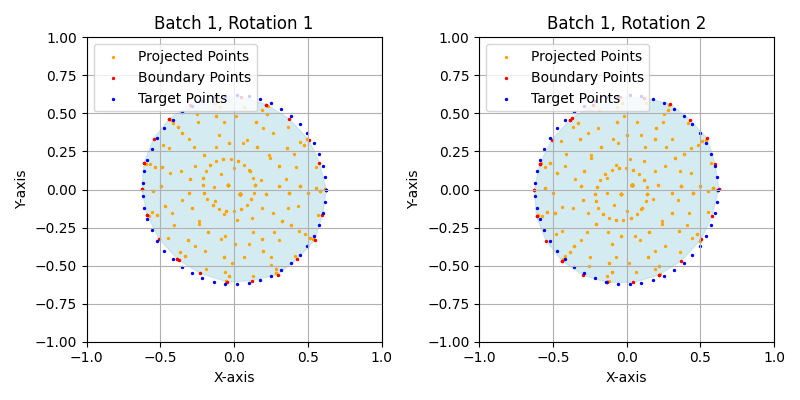

0.007051238790154457 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   51 ellipsoid estimate (0.604, 0.656, 0.602, 3.357e-17°, 51.3°, 120.2°) has volume 1.0 and surface area 4.8421. LR 1
torch.Size([1, 2, 2, 288])


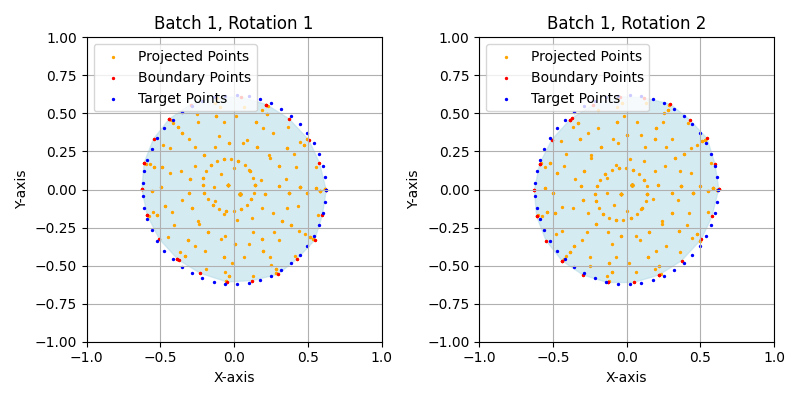

0.007014957256615162 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   52 ellipsoid estimate (0.605, 0.656, 0.602, 4.09e-17°, 51.28°, 120.3°) has volume 1.0 and surface area 4.8419. LR 1
torch.Size([1, 2, 2, 288])


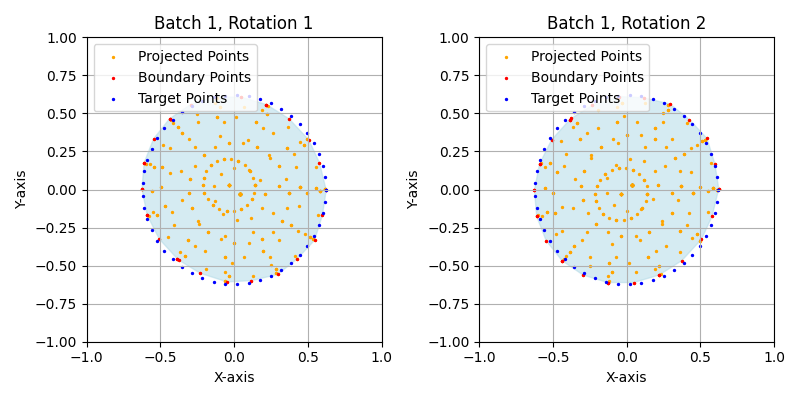

0.006981893442571163 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   53 ellipsoid estimate (0.606, 0.655, 0.601, 1.777e-17°, 51.28°, 120.3°) has volume 1.0 and surface area 4.8418. LR 1
torch.Size([1, 2, 2, 288])


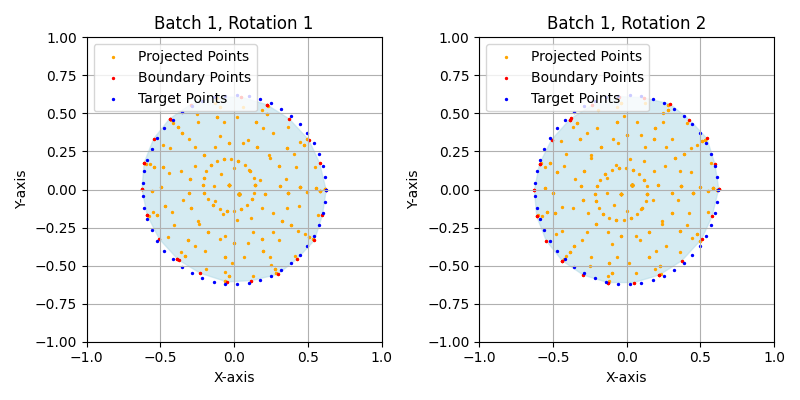

0.006953008938580751 tensor([[ 1.4992e-04,  1.5398e-04,  1.4841e-04,  ..., -1.1991e-04,
         -1.1110e-04, -9.6423e-05]], dtype=torch.float64)
   54 ellipsoid estimate (0.606, 0.655, 0.601, 1.081e-16°, 51.29°, 120.3°) has volume 1.0 and surface area 4.8416. LR 1
torch.Size([1, 2, 2, 288])


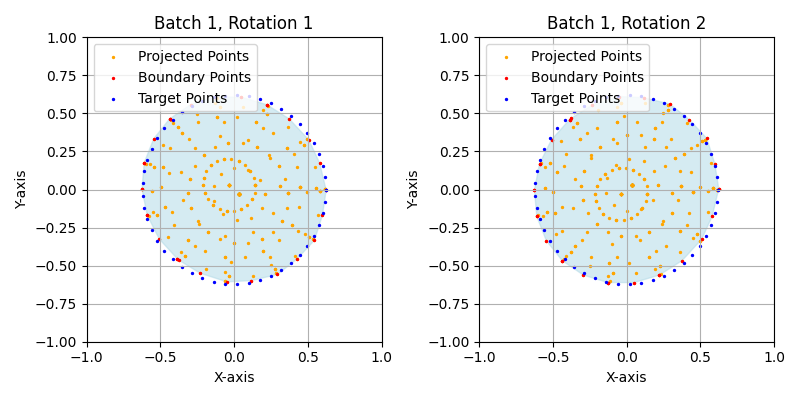

0.006924138404428959 tensor([[ 0.0002,  0.0002,  0.0002,  ..., -0.0001, -0.0001, -0.0001]],
       dtype=torch.float64)
   55 ellipsoid estimate (0.607, 0.654, 0.601, -4.468e-17°, 51.3°, 120.4°) has volume 1.0 and surface area 4.8414. LR 1
torch.Size([1, 2, 2, 288])


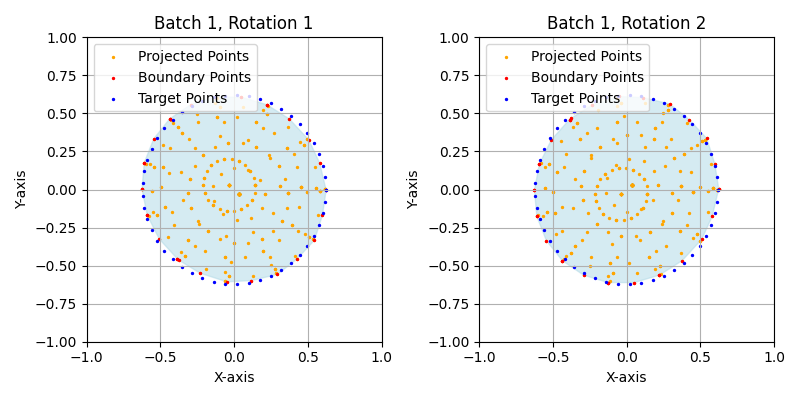

0.006897210143506527 tensor([[ 1.4859e-04,  1.5537e-04,  1.5256e-04,  ..., -1.1441e-04,
         -1.0823e-04, -9.5802e-05]], dtype=torch.float64)
   56 ellipsoid estimate (0.607, 0.654, 0.601, -6.902e-17°, 51.3°, 120.4°) has volume 1.0 and surface area 4.8413. LR 1
torch.Size([1, 2, 2, 288])


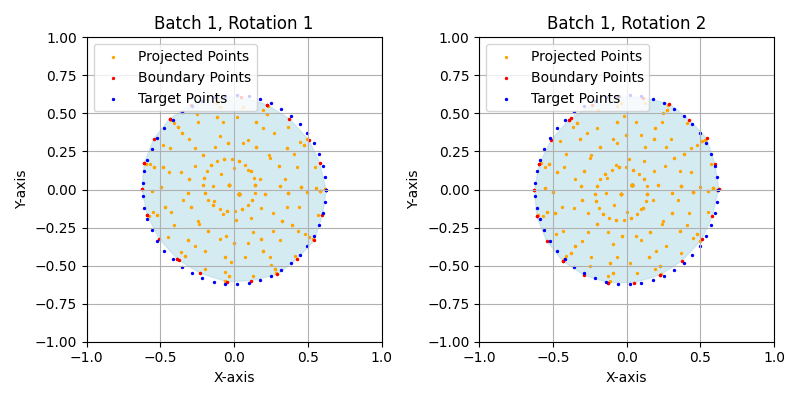

0.00687313312664628 tensor([[ 1.3935e-04,  1.4586e-04,  1.4371e-04,  ..., -1.0758e-04,
         -1.0159e-04, -8.9928e-05]], dtype=torch.float64)
   57 ellipsoid estimate (0.608, 0.653, 0.602, 1.365e-16°, 51.28°, 120.4°) has volume 1.0 and surface area 4.8411. LR 1
torch.Size([1, 2, 2, 288])


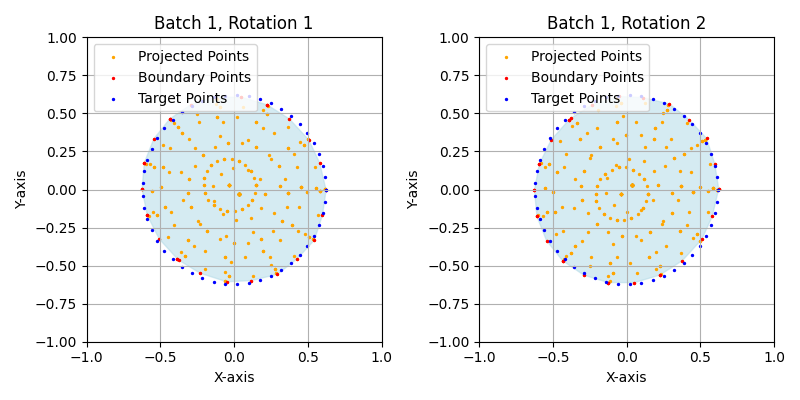

0.006851835176348686 tensor([[ 1.3060e-04,  1.3674e-04,  1.3501e-04,  ..., -1.0123e-04,
         -9.5348e-05, -8.4347e-05]], dtype=torch.float64)
   58 ellipsoid estimate (0.608, 0.653, 0.602, 7.712e-17°, 51.26°, 120.5°) has volume 1.0 and surface area 4.841. LR 1
torch.Size([1, 2, 2, 288])


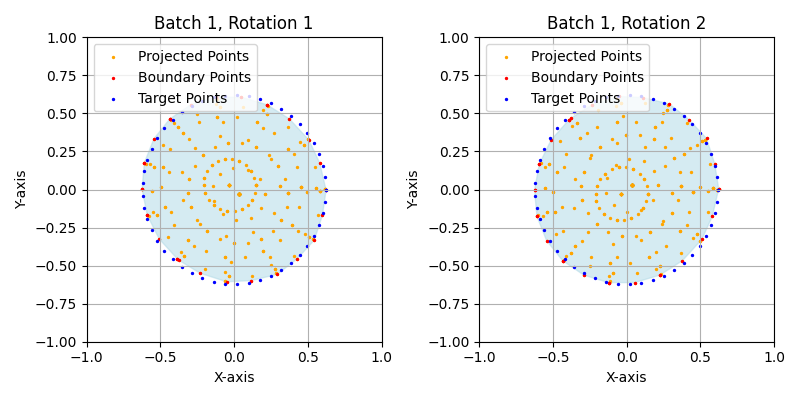

0.006833057850599289 tensor([[ 1.2245e-04,  1.2811e-04,  1.2660e-04,  ..., -9.5405e-05,
         -8.9581e-05, -7.9126e-05]], dtype=torch.float64)
   59 ellipsoid estimate (0.608, 0.652, 0.602, -2.295e-17°, 51.24°, 120.5°) has volume 1.0 and surface area 4.8409. LR 1
torch.Size([1, 2, 2, 288])


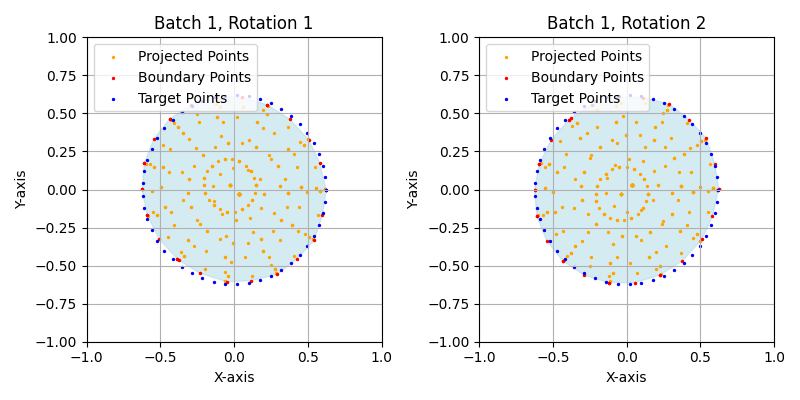

0.00681645330041647 tensor([[ 1.1493e-04,  1.2003e-04,  1.1858e-04,  ..., -9.0095e-05,
         -8.4297e-05, -7.4294e-05]], dtype=torch.float64)
Final ellipsoid (0.608498, 0.651748, 0.601967, 360.0, 51.2, 120.5) has volume 1.0 and surface area 4.84073.


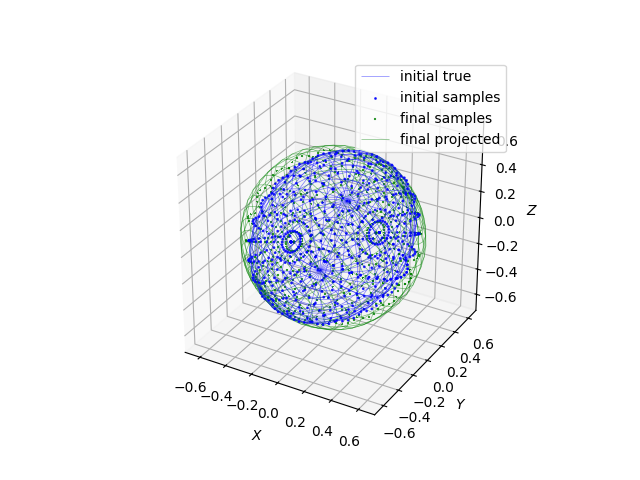

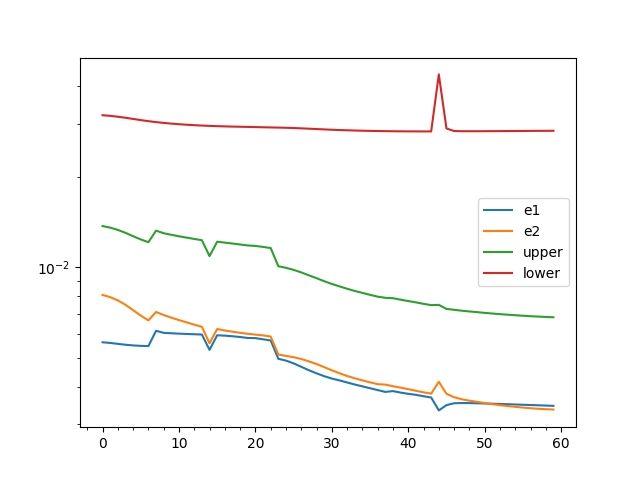

In [19]:
# sample a noisy ellipse
view_angles = torch.deg2rad(torch.tensor([
    [0,0,0],
    [0,0,90],
    # [10, 32, 96]
], dtype=torch.double))
rot_mats= rotation_matrix_3d_batch(view_angles)
r=0.620350490899
targets = torch.stack([
    sample_target_ellipse(50,a=r,b=r),
    sample_target_ellipse(50,a=r,b=r),
])

views = (rot_mats, targets)
u_original = (a,b,c,yaw,pitch,roll)

sqrt_m = 25
a, b, c = 0.5, 0.6, 0.7
yaw, pitch, roll = 30, 40, 50
nu = 1.0e-4
p = 1.6075

m, data, u = inner_problem((a,b,c), (yaw,pitch,roll), sqrt_m, nu, p, method="default", with_jac=False)
u = outer_problem(m, data, views=views, original_params=u_original, loss_func=ChamferLossBoundary, n_iters=60, with_jac=False, lr=1, moment=0.6, method="default")

Ellipsoid (blue) (0.5, 0.6, 0.7, 30.0°, 40.0°, 50.0°) has volume 0.88 and surface area 4.51
Ellipsoid (red) (0.528, 0.642, 0.705, 30.01°, 39.99°, 50.0°) has volume 1.0 and surface area 4.89


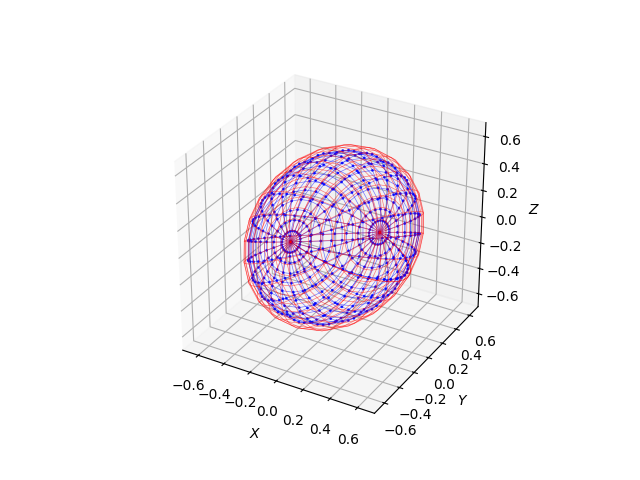

Theoretical min surface area is 4.835975862043171
    0 ellipsoid estimate (0.528, 0.642, 0.705, 30.01°, 39.99°, 50.0°) has volume 1.0 and surface area 4.8941. LR 2
torch.Size([1, 2, 2, 288])


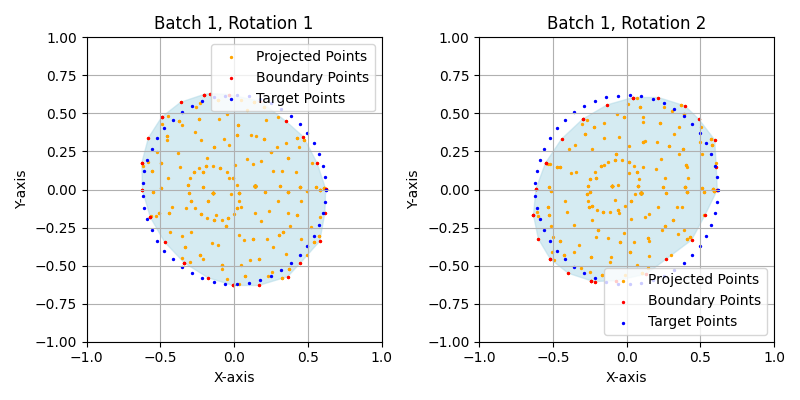

0.013716474175453186 tensor([[ 0.0004,  0.0004,  0.0004,  ..., -0.0003, -0.0003, -0.0003]],
       dtype=torch.float64)
    1 ellipsoid estimate (0.53, 0.64, 0.704, 30.36°, 39.71°, 50.18°) has volume 1.0 and surface area 4.8912. LR 2
torch.Size([1, 2, 2, 288])


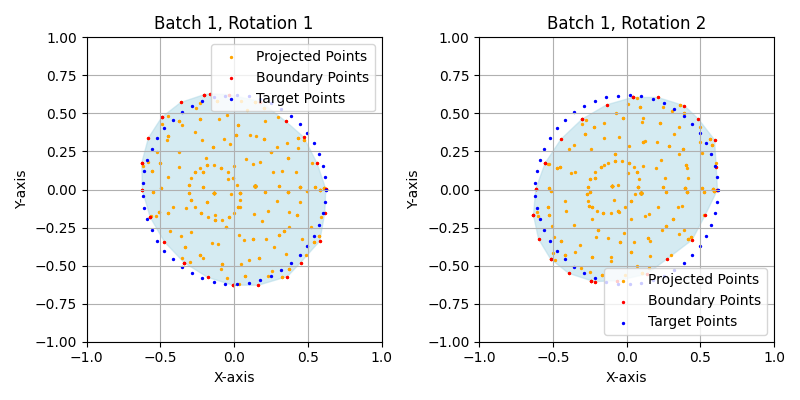

0.01339902263134718 tensor([[ 0.0003,  0.0004,  0.0003,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
    2 ellipsoid estimate (0.534, 0.637, 0.702, 31.12°, 39.17°, 50.53°) has volume 1.0 and surface area 4.8866. LR 2
torch.Size([1, 2, 2, 288])


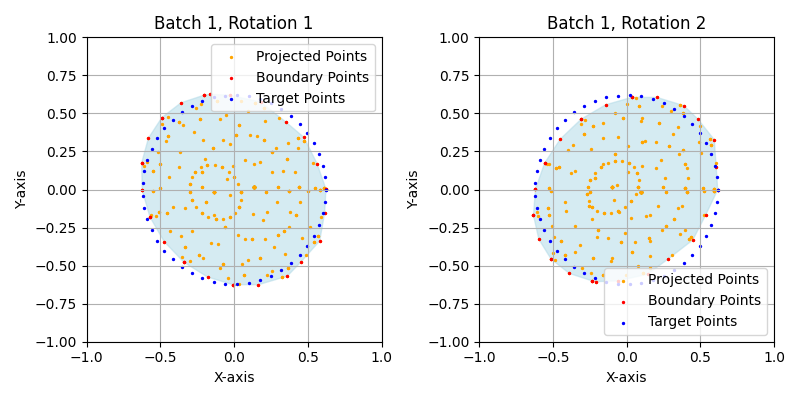

0.012858852744102478 tensor([[ 0.0004,  0.0004,  0.0003,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
    3 ellipsoid estimate (0.54, 0.633, 0.699, 32.31°, 38.27°, 51.3°) has volume 1.0 and surface area 4.8808. LR 2
torch.Size([1, 2, 2, 288])


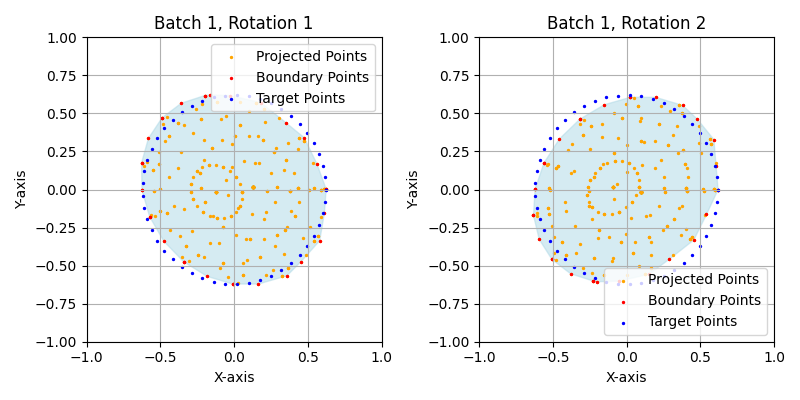

0.012210593558847904 tensor([[ 0.0003,  0.0004,  0.0003,  ..., -0.0003, -0.0003, -0.0002]],
       dtype=torch.float64)
    4 ellipsoid estimate (0.546, 0.629, 0.696, 33.82°, 37.06°, 52.35°) has volume 1.0 and surface area 4.8751. LR 2
torch.Size([1, 2, 2, 288])


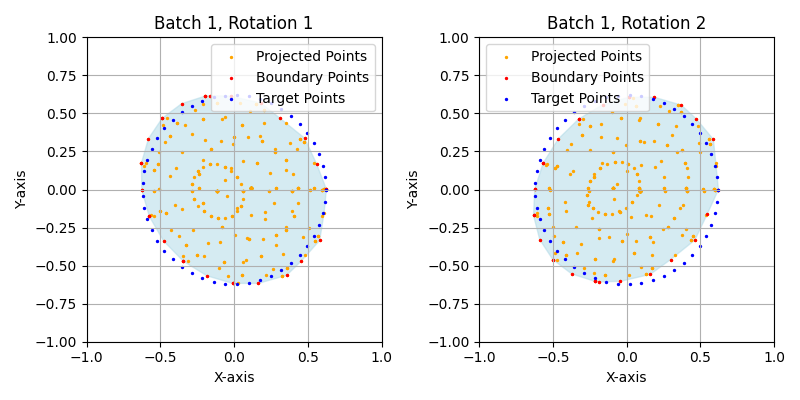

0.012929050251841545 tensor([[ 0.0003,  0.0003,  0.0003,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
    5 ellipsoid estimate (0.551, 0.625, 0.692, 35.49°, 35.5°, 53.56°) has volume 1.0 and surface area 4.87. LR 2
torch.Size([1, 2, 2, 288])


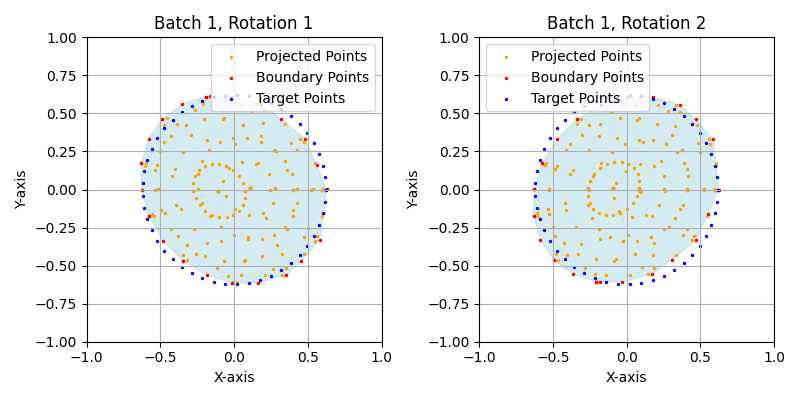

0.0124878641217947 tensor([[ 0.0003,  0.0003,  0.0004,  ..., -0.0002, -0.0002, -0.0002]],
       dtype=torch.float64)
    6 ellipsoid estimate (0.556, 0.623, 0.689, 37.21°, 33.56°, 54.89°) has volume 1.0 and surface area 4.8657. LR 2
torch.Size([1, 2, 2, 288])


KeyboardInterrupt: 

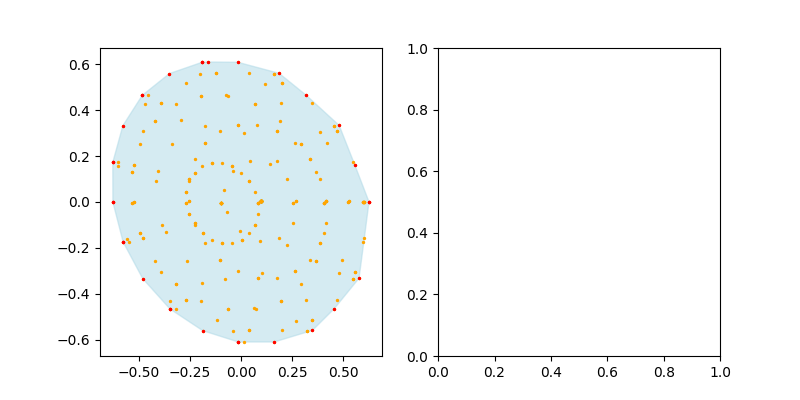

In [22]:
### PYTORCH3D VERSION


class NaiveChamferLossBoundary(nn.Module):
    def __init__(self, views, loss_vals, m=50):
        super().__init__()
        rot_mats, contours = views
        self.rot_mats = rot_mats
        self.target_pts = contours
        self.loss_vals = loss_vals
        self.m = m # how many points to sample

    def forward(self, input, p=1.6075):
        A = A_from_u_batch(input).double()
        # print("A", A, "angles", np.deg2rad(get_angles(A.squeeze().detach().numpy())))
        n_batches = A.size(0)
        n_rot = self.rot_mats.size(0)
        matrix_sqrts = torch.empty((n_rot, n_batches, 3, 3), dtype=torch.double) # n_rot x n_batches x 3 x 3
        for i, R in enumerate(self.rot_mats):
            rotated_A = R.mT @ A @ R
            matrix_sqrts[i] = self.pos_sqrt(rotated_A)
        matrix_sqrts = matrix_sqrts.transpose(0,1)
        sampled_pts = self.sample_ellipsoid_pts(matrix_sqrts, m=12) # n_batches x n_rot x 3 x N
        # sampled_pts = sampled_pts.squeeze().detach()
        # for i, e in enumerate(sampled_pts):
        #     u = fit_ellipsoid(e.unsqueeze(0))
        #     print(u)
        #     a,b,c,yaw,pitch,roll = u[0].squeeze()
        #     yaw,pitch,roll = torch.rad2deg(torch.tensor([yaw,pitch,roll]))
        #     fig = plt.figure()
        #     ax = fig.add_subplot(111, projection='3d')
        #     plot_ellipsoid(ax, a,b,c,yaw,pitch,roll)
        #     ax.set_xlabel('$X$')
        #     ax.set_ylabel('$Y$')
        #     ax.set_zlabel('$Z$')
        #     ax.scatter(e[0].numpy(), e[1].numpy(), e[2].numpy(), color='b', alpha=0.8, s=1)
        #     ax.set_aspect('equal', adjustable='box')
        #     plt.show()
        # raise NotImplementedError
        projected_pts = self.project(sampled_pts) # n_batches x n_rot x 2 x N
        # print("projected points shape", projected_pts.size(), projected_pts.dtype)
        projected_pts_np = projected_pts.transpose(-1, -2).detach().cpu().numpy() # n_batches x n_rot x N x 2
        hulls = []
        alphas = []
        boundary_points = []
        lengths = []
        for b, batch in enumerate(projected_pts_np):
            batch_boundary_points = []      
            batch_hull = []
            for r, rot_pts in enumerate(batch):
                # print(f"Batch {b+1} Rotation {r+1}")
                # print("Optimising alpha")
                # alpha = alphashape.optimizealpha(rot_pts, max_iterations=50)
                # alphas.append(alpha)
                # print("Finding alpha shape")
                hull = alphashape.alphashape(rot_pts, 0)
                # print("Found alpha shape")
                batch_hull.append(hull)
                boundary = hull.exterior.coords.xy # shape of 2 x N boundary points
                boundary_torch = self.find_common_points(projected_pts[b,r,:,:], boundary)
                # print("boundary torch size", boundary_torch.size())
                batch_boundary_points.append(boundary_torch)
            hulls.append(batch_hull)
            if False:
                batch_lengths = torch.tensor([t.size(1) for t in batch_boundary_points])
                lengths.append(batch_lengths)
                max_length = batch_lengths.max()
                padded = []
                # print("maxlength", max_length)
                for t in batch_boundary_points:
                    if max_length == t.size(1):
                        padded.append(t)
                    else:
                        padded.append(torch.cat([t, torch.full((t.size(0), max_length - t.size(1)), float('nan'))], dim=1))
                padded_batch_boundary_points = torch.stack(padded)
                boundary_points.append(padded_batch_boundary_points)
            else:
                batch_lengths = torch.tensor([t.size(1) for t in batch_boundary_points])
                lengths.append(batch_lengths)
                min_length = batch_lengths.min()
                truncated = torch.stack([t[:,:min_length] for t in batch_boundary_points])
                boundary_points.append(truncated)
        # print("Alphas:", alphas)
        # self.plot_alpha_shapes(projected_pts, boundary_points, hulls)
        chamfer_dist = 0
        for batch, b_lengths in zip(boundary_points, lengths):
            chamfer_dist += self.chamfer(batch.transpose(-1,-2), b_lengths)
        return chamfer_dist

    def project(self, points: torch.tensor):
        # Assuming points shape is (n_batches x n_rot x 3 x N)
        projection = points[:, :, :2, :]  # Keep only the first 2 coordinates for projection
        return projection

    def chamfer(self, sampled_pts, lengths):
        dist_matrix = torch.cdist(sampled_pts, self.target_pts, p=2)
        min_d_sampled_to_target, _ = torch.min(dist_matrix, dim=1)
        min_d_target_to_sampled, _ = torch.min(dist_matrix, dim=2)
        chamfer_dist = min_d_sampled_to_target.mean(dim=1) + min_d_target_to_sampled.mean(dim=1)
        for i, l in enumerate(chamfer_dist):
            self.loss_vals[f"e{i+1}"].append(l.item())
        print(chamfer_dist.sum().item())
        return chamfer_dist.sum()
    
    def find_common_points(self, pts_torch, pts_np):
        """
        shape of both input arrays/tensors is d x N, where d is the dimension of the point
        """
        np_to_torch = torch.tensor(pts_np, device=pts_torch.device, dtype=pts_torch.dtype)
        selected_points = []
        for i in range(pts_torch.shape[1]): 
            point = pts_torch[:, i]  
            if any(torch.allclose(point, np_to_torch[:, j], atol=1e-6) for j in range(np_to_torch.shape[1])):
                selected_points.append(point)  
        if selected_points:
            selected_points_tensor = torch.stack(selected_points, dim=1) 
        else:
            selected_points_tensor = torch.empty(2, 0, device=pts_torch.device)
        
        return selected_points_tensor

    def sample_ellipsoid_pts(self, sqrtA, m=50):
        phi = 2.0 * math.pi * torch.linspace(0.0, 1.0, m).double()
        theta = math.pi * torch.linspace(0.0, 1.0, m).double()
        phi, theta = torch.meshgrid(phi, theta)
        x = torch.sin(theta) * torch.cos(phi)
        y = torch.sin(theta) * torch.sin(phi)
        z = torch.cos(theta)
        coords = torch.stack((x.flatten(), y.flatten(), z.flatten()), dim=0).double().to(sqrtA.device)
        x = torch.sin(phi) * torch.cos(theta)
        y = torch.sin(phi) * torch.sin(theta)
        z = torch.cos(phi)
        coords2 = torch.stack((x.flatten(), y.flatten(), z.flatten()), dim=0).double().to(sqrtA.device)
        coords = torch.cat([coords, coords2], dim=1)
        inverse_sqrtA = torch.linalg.inv(sqrtA)#.transpose(-1,-2)
        sampled_pts = inverse_sqrtA @ coords
        return sampled_pts

    def pos_sqrt(self, A):
        """
        A: a (batch_size x dxd) tensor where d is the dimension of the data
        """
        L = torch.linalg.cholesky(A, upper=True)
        # U,S,Vh = torch.linalg.svd(A)
        # S = torch.sqrt(S)
        # L = U @ torch.diagflat(S) @ Vh
        return L
    

    def plot_alpha_shapes(self, projected_pts, boundary_points, hulls):
            print(projected_pts.size())
            n_batches, n_rot, _, _ = projected_pts.size()
            fig, axs = plt.subplots(n_batches, n_rot, figsize=(4 * n_rot, 4 * n_batches), squeeze=False)

            for b in range(n_batches):
                for r in range(n_rot):
                    # Get the projected points for the current batch and rotation
                    rot_pts = projected_pts[b, r, :, :].detach().cpu().numpy()  # shape (2, N)

                    # Plot the alpha shape
                    hull = hulls[b][r]  # Access the corresponding hull
                    patch = PolygonPatch(hull, alpha=0.5, color='lightblue', edgecolor='blue')
                    axs[b, r].add_patch(patch)

                    # Plot the projected points
                    axs[b, r].scatter(rot_pts[0], rot_pts[1], color='orange', label='Projected Points', s=2)

                    # Get and plot boundary points for the current batch and rotation
                    batch_boundary_points = boundary_points[b][r].detach().cpu().numpy()  # shape (2, M)
                    axs[b, r].scatter(batch_boundary_points[0], batch_boundary_points[1], color='red', label='Boundary Points', s=2)

                    # Plot the target shape
                    target_contour = self.target_pts[r].mT
                    axs[b, r].scatter(target_contour[0], target_contour[1], color='blue', label ='Target Points', s=2)

                    # Set titles and labels
                    axs[b, r].set_title(f'Batch {b+1}, Rotation {r+1}')
                    axs[b, r].set_xlabel('X-axis')
                    axs[b, r].set_ylabel('Y-axis')
                    axs[b, r].set_xlim(-1, 1)  # Adjust limits based on your data
                    axs[b, r].set_ylim(-1, 1)
                    axs[b, r].grid()
                    axs[b, r].legend()

            plt.tight_layout()
            plt.show()


# sample a noisy ellipse
view_angles = torch.deg2rad(torch.tensor([
    [0,0,0],
    [0,0,90],
    # [10, 32, 96]
], dtype=torch.double))
rot_mats= rotation_matrix_3d_batch(view_angles)
r=0.620350490899
targets = torch.stack([
    sample_target_ellipse(50,a=r,b=r),
    sample_target_ellipse(50,a=r,b=r),
])

views = (rot_mats, targets)
u_original = (a,b,c,yaw,pitch,roll)

sqrt_m = 25
a, b, c = 0.5, 0.6, 0.7
yaw, pitch, roll = 30, 40, 50
nu = 1.0e-4
p = 1.6075

m, data, u = inner_problem((a,b,c), (yaw,pitch,roll), sqrt_m, nu, p, method="default", with_jac=False)
u = outer_problem(m, data, views=views, original_params=u_original, loss_func=ChamferLossBoundary, n_iters=90, with_jac=False, lr=2, moment=0.8, method="default")